Axiomatic Data: Employee benefit data predictive in trading strategies
=========================================================

Data Source, Coverage & Frequency:

* Quantitative data on over 1 million U.S. companies (public and private) that file employee benefit plans.
* Extracted and aligned from Form 5500 (ERISA) filings (welfare & retirement benefit plans).
* Mandatory annual filings for each plan, with possible updates & amendments.
* Updated monthly by Department of Labor, since companies file for different plans throughout the year.

Historical data & ticker mapping:

* Point in time historical data, goes back to 2010-2011, with filing date being reported.
* Publicly available, clean, harmonized data extracted from regulatory government filings.
* 6 years of point in time historical dataset.
* Historical data is mapped to Russell 3000 tickers between January 2013 – December 2018.

Use Cases of the data:

* Leading indicator of financial health of companies.
* Signals extracted from Changes to Employee Benefit plans:
     1. ESG signals. 
     2. Growth trends. 
     3. Credit signals. 
     4. Macro signals.

Python Libraries Imported:
======================

In [1]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import glob
import csv

from sklearn import datasets
from sklearn import random_projection
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn import covariance
from sklearn.manifold import TSNE
from sklearn.neighbors.kde import KernelDensity as sclKDE
from sklearn.preprocessing import StandardScaler,MinMaxScaler

import datetime as dt

from bokeh import layouts
from bokeh.io import push_notebook, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource,CategoricalColorMapper,DataRange1d,HoverTool,Title,NumeralTickFormatter,Legend,LabelSet
from bokeh.resources import INLINE
from bokeh.core.properties import value
from bokeh.layouts import column,row,widgetbox
from bokeh.models.glyphs import Patch
from bokeh.palettes import inferno,viridis,d3
from bokeh.transform import linear_cmap,factor_cmap,transform,stack

import warnings
warnings.simplefilter('ignore')
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

output_notebook()

import requests
from requests.adapters import HTTPAdapter
import io
import os
import zipfile
import csv

import numpy as np
import datetime
from datetime import date, timedelta
import matplotlib.pyplot as plt
from scipy.stats import norm
import pandas as pd
import pandas as pd
import glob
from sklearn import preprocessing

Loading BokehJS ...

In [2]:
def portfolioCreator():
    """
    Creates a dictionary of dataframes(dates*stocks) of russell esg data
    """
    #Reading the dates and allocating memory
    dates = pd.read_csv(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\Variable_individual_files\dates.csv',header = None,names = ["Date"])
    dates['Date'] = pd.to_datetime(dates['Date'],dayfirst =True)
    files = glob.glob(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\Variable_individual_files\cl_*.csv')
    portfolio = dict()
    
    for file in files:
        
        df = pd.read_csv(file)
        df['Unnamed: 0']= dates['Date']
        df.set_index('Unnamed: 0',inplace = True)
        df.index.names = ['Date']
      
        ticker_list = pd.read_csv(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\Variable_individual_files\russel_ticker_list.csv')['Symbol']
#         df = df.loc[:,ticker_list].dropna(axis=1, how='all')
        
        portfolio[file[file.find('cl_')+3:file.rfind('.')]] = df
        
    return portfolio

'''
Change path while assigning value to ticker_list
'''

'\nChange path while assigning value to ticker_list\n'

In [3]:
portfolio = portfolioCreator()

In [4]:
'''
reading the adjusted close dataframe (change PATH)
'''
adj_close = pd.read_csv(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\quandl_data.csv')

In [5]:
'''
Removing unwanted noise from quandl data
'''
adj_close.columns
adj_close.loc[[1012,1013,1014,1015], 'AQB'] = np.nan


'\nRemoving unwanted noise from quandl data\n'

In [6]:
'''
Data cleaning and preprocessing
'''
adj_close.set_index('Unnamed: 0',inplace = True)
adj_close.index.names = ['Date']
adj_close.index = pd.to_datetime(adj_close.index,yearfirst = True)
adj_close = adj_close.resample('M').first()
adj_close.index = portfolio['pens_contrib_per_partcp'].index
adj_close = adj_close.ffill()
adj_close = adj_close.bfill()       

In [7]:
'''
taking common columns in adjusted close dataframe and parameters of russell stocks
'''

com_col = portfolio['pens_partcp_contrib_per_partcp'].columns.intersection(adj_close.columns)
com_col

Index(['PEBO', 'CIX', 'NDAQ', 'DIOD', 'RNR', 'CI', 'TTI', 'SIVB', 'CARS',
       'ELAN',
       ...
       'QUIK', 'SPB', 'HAIN', 'CARA', 'TFSL', 'FIZZ', 'WDFC', 'RARE', 'EE',
       'KNSA'],
      dtype='object', length=2956)

In [8]:
adj_close = adj_close.loc[:,com_col]
adj_close.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,18.033320,13.996469,22.981951,18.030,75.526915,55.020615,7.95,58.24,27.28,36.0,...,2.23,46.320434,28.240,12.91,8.113656,13.391366,42.990635,42.25,27.305423,19.47
2013-02-01,17.854451,12.376013,25.551362,19.130,80.069537,58.731215,8.61,67.04,27.28,36.0,...,2.11,49.432401,28.660,12.91,8.518513,12.771738,48.069029,42.25,28.263654,19.47
2013-03-01,17.797094,12.224652,28.174302,19.498,81.645929,58.112782,8.96,66.66,27.28,36.0,...,2.14,50.868693,27.470,12.91,8.725072,12.503540,49.249734,42.25,28.038678,19.47
2013-04-01,18.010135,11.275682,28.673585,20.080,86.101017,62.793104,9.68,70.48,27.28,36.0,...,2.41,48.714255,30.395,12.91,8.832483,12.790234,47.666516,42.25,27.869244,19.47
2013-05-01,16.305809,10.961221,26.201261,19.500,87.495176,65.258514,8.95,69.25,27.28,36.0,...,2.43,52.364831,32.300,12.91,8.939894,13.391366,47.141700,42.25,31.319322,19.47


In [9]:
'''
Defining useful functions for Trading strategy development
'''

def csRank(x=pd.DataFrame()):
    y2=x.rank(axis=1, ascending = False ,pct=True)
    return y2

def csMean(x=pd.DataFrame()):
    y=pd.DataFrame(columns=x.columns,index=x.index)
    for i in range(len(x.columns)):
        y.iloc[:,i]=x.mean(axis=1)
    return y

def SMA(x=pd.DataFrame(),k=30):
    y=pd.DataFrame(columns = x.columns)
    for i in range(0,len(x.columns)):
        y.iloc[:,i]=pd.Series(tb.SMA(((x.iloc[:,i]).values.astype(dtype='f8')),timeperiod=k))
    y2=y.set_index(x.index)
    return y2

def stdDev(x=pd.DataFrame(),k=30):
    y=pd.DataFrame(columns = x.columns)
    for i in range(0,len(x.columns)):
        y.iloc[:,i]=pd.Series(tb.STDDEV((x.iloc[:,i]).values.astype(dtype='f8'),timeperiod=k))
    y2=y.set_index(x.index)
    return y2

def tsZscore(x=pd.DataFrame(),k=30):
    y = pd.DataFrame(columns=x.columns, index=x.index)
    y = (x-SMA(x,k))/stdDev(x,k)
    return y

In [10]:
'''
Using the following for Trading strategy 1
'''

c = portfolio['pens_partcp_contrib_per_partcp'].loc[:,com_col]
d = (portfolio['pens_emplr_contrib_amt']*portfolio['pens_cd_section_401k_ind']).loc[:,com_col]

'''
END
'''


'''
Using the following for Trading strategy 2
'''

d = (portfolio['welf_plan_ind'].loc[:,com_col])
d1 = (portfolio['welf_health_ins_ind'].loc[:,com_col])
d2= (portfolio['welf_life_ins_ind'].loc[:,com_col])
d3 = (portfolio['pens_plan_ind'].loc[:,com_col])
d4 = (portfolio['pens_defined_contrib_pens_ind'].loc[:,com_col])
d5 = (portfolio['pens_emplr_contrib_ind'].loc[:,com_col])

df6 = portfolio['pens_fail_transmit_contrib_ind'].loc[:,com_col]
df7 = portfolio['welf_fail_transmit_contrib_ind'].loc[:,com_col]
df8 = portfolio['fail_transmit_contrib_ind'].loc[:,com_col]
df9 = portfolio['pens_fail_provide_benefit_due_ind'].loc[:,com_col]
df10 = portfolio['welf_fail_provide_benefit_due_ind'].loc[:,com_col]
df11 = portfolio['fail_provide_benefit_due_ind'].loc[:,com_col]
stress = df6+df7+df8+df9+df10+df11

e = csRank(d+d1+d2+d3+d4+d5-stress)/csMean(d+d1+d2+d3+d4+d5-stress)

'''
END
'''

alpha = e

In [11]:
def ranker(toRank = pd.DataFrame()):
    """
    Returns the daily ranking of all the stocks in the 
    universe excluding NaNs
    """
    return (toRank).rank(axis=1,ascending = False,na_option = 'bottom')

In [12]:
'''
ranking the alpha
1st rank to highest value
'''

alpha_rank = ranker(alpha)
alpha_rank.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1887.5,1887.5,1887.5,1887.5,439.5,1887.5,1887.5,1887.5,1887.5,2813.0,...,152.0,1887.5,1887.5,152.0,1887.5,1887.5,1887.5,2813.0,1887.5,2813.0
2013-02-01,1887.0,1887.0,1887.0,1887.0,437.0,1887.0,1887.0,1887.0,1887.0,2813.0,...,151.5,1887.0,1887.0,151.5,1887.0,1887.0,1887.0,2813.0,1887.0,2813.0
2013-03-01,1887.5,1887.5,1887.5,1887.5,434.5,1887.5,1887.5,1887.5,1887.5,2813.0,...,150.5,1887.5,1887.5,150.5,1887.5,1887.5,1887.5,2813.0,1887.5,2813.0
2013-04-01,1889.0,1889.0,1889.0,1889.0,429.0,1889.0,1889.0,1889.0,1889.0,2813.5,...,147.5,1889.0,1889.0,147.5,1889.0,1889.0,1889.0,2813.5,1889.0,2813.5
2013-05-01,1890.5,1890.5,1890.5,1890.5,425.5,1890.5,1890.5,1890.5,1890.5,2814.5,...,145.0,1890.5,1890.5,145.0,1890.5,1890.5,1890.5,2814.5,1890.5,2814.5


In [13]:
def monthlySampler(portfolio = portfolio):
    
    return {
    'close_monthly' :adj_close ,
    }  

monthly_data = monthlySampler()

updated_dates = portfolio['pens_dfn_contrib_emplr_contrib_amt'].index

'''
Redundant functions to mould data to work according to legacy code
'''

'\nRedundant functions to mould data to work according to legacy code\n'

In [14]:
monthly_returns = adj_close.pct_change()
monthly_returns = monthly_returns.fillna(0)
monthly_returns.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
2013-02-01,-0.009919,-0.115776,0.111801,0.061009,0.060146,0.067440,0.083019,0.151099,0.0,0.0,...,-0.053812,0.067183,0.014873,0.0,0.049898,-0.046271,0.118128,0.0,0.035093,0.0
2013-03-01,-0.003212,-0.012230,0.102654,0.019237,0.019688,-0.010530,0.040650,-0.005668,0.0,0.0,...,0.014218,0.029056,-0.041521,0.0,0.024248,-0.020999,0.024563,0.0,-0.007960,0.0
2013-04-01,0.011971,-0.077628,0.017721,0.029849,0.054566,0.080539,0.080357,0.057306,0.0,0.0,...,0.126168,-0.042353,0.106480,0.0,0.012311,0.022929,-0.032147,0.0,-0.006043,0.0
2013-05-01,-0.094631,-0.027888,-0.086223,-0.028884,0.016192,0.039262,-0.075413,-0.017452,0.0,0.0,...,0.008299,0.074939,0.062675,0.0,0.012161,0.046999,-0.011010,0.0,0.123795,0.0


Data back-testing: Designing the back-tester for historical data:
===================================================

In [15]:
def backtest(buckets = 1, alpha = alpha, monthly_data = monthly_data, monthly_returns=monthly_returns, daily_rank = alpha_rank, initial_capital = 20000, updated_dates = updated_dates, brokerage_rate = 0.001, quintile = 1):    
    
    close = monthly_data['close_monthly'].copy()
    
    holdings = pd.Series(index = daily_rank.index)
    booksize = pd.Series(index = daily_rank.index)
    brokerage = pd.Series(index = daily_rank.index)
    daily_pnl = pd.Series(index = adj_close.index)
    
    daily_dfs = []
    yesterday_idx = updated_dates[0]
    
    for date_idx in updated_dates:
        
        today_df = pd.DataFrame(index = close.columns,columns=['weight', 'rank', 'qty', 'price']) 
        
        today_df['rank'] = daily_rank.loc[date_idx,:]
        today_df['price'] = close.loc[date_idx, :]

        today_df['weight'] = alpha.loc[date_idx, :]
    
        today_df = today_df.sort_values('rank')
#       sorts in ascending order of rank 

        nan_stocks = today_df[today_df['weight'].isna()].index.tolist()
        today_df = today_df.drop(nan_stocks)
        
        if len(daily_dfs) == 0:
                
            booksize[date_idx] = initial_capital
            daily_pnl[date_idx] = 0
            brokerage[date_idx] = 0  
                
        elif len(daily_dfs)>0:
            
            prev_df = daily_dfs[-1]
            prev_univ = holdings[yesterday_idx]

            brokerage[date_idx] = ((today_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']+prev_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty'])*brokerage_rate).sum()
            daily_pnl[date_idx] = (today_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']-prev_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']).sum() - brokerage[date_idx]
            
            cash = initial_capital+daily_pnl[:date_idx].sum()
            cash = max(0,cash)
            booksize[date_idx] = min(initial_capital,cash)
         
        '''
        Use for quintile level backtesting
        '''
        
#       today_df = today_df.iloc[ int(len(today_df)/buckets)*(quintile-1) :int(len(today_df)/buckets)*(quintile), :]    
        
        '''
        ATR Weighing
        '''
#         risk_factor = 0.01
#         today_df['qty'] = np.floor((booksize[date_idx]*risk_factor)/(ATR20.loc[date_idx,:]))
        
#         holdings[date_idx] = today_df[((today_df['qty']*today_df['price']).cumsum()<booksize[date_idx])].dropna().index
        '''
        END
        '''
        
        holdings[date_idx] = today_df.index
#         print(holdings[date_idx])
        
        '''
        MIN MAX WEIGHING (USE FOR LONG ONLY OR SHORT ONLY BUILDING)
        '''
        
#         float_array = today_df['weight'].values.astype(float).reshape(-1,1)
#         min_max_scaler = preprocessing.MinMaxScaler()
#         min_max_scaler.fit(float_array)
#         scaled_array = min_max_scaler.transform(float_array)
#         df_normalized = pd.DataFrame(data = scaled_array, index = today_df.index)
#         df_normalized = df_normalized/df_normalized.sum()
#         today_df['weight'] = df_normalized

        '''
        END
        '''
        
        '''
        BASIC NORMALIZATION
        '''
        
        today_df['weight'] = today_df['weight']/abs(today_df['weight']).sum()
        
        '''
        END
        '''
        
        '''
        EQUAL WEIGHING
        '''
#         today_df['weight'] = 1/len(today_df)
           
        '''
        END
        '''
        
        today_df['qty'] = np.floor(booksize[date_idx]*today_df['weight']/today_df['price'])
        
        daily_dfs.append(today_df)
        yesterday_idx = date_idx
    
    daily_pnl = daily_pnl.fillna(0)
    brokerage = brokerage.fillna(0)
    booksize = booksize.ffill()
    booksize = booksize.bfill()
    
    return [daily_pnl,booksize,brokerage,daily_dfs]

Pnl - Drawdown - Turnover (Month-over-month returns):
=============================================

Visualization for strategy 2 (run this when alpha =e)

In [16]:
initial_capital = 20000000

raw_pnl = backtest(initial_capital = initial_capital, brokerage_rate=0.00)[0]
brok = backtest(initial_capital = initial_capital, brokerage_rate=0.001)[2]

'''
Returns
'''

pnl = pd.DataFrame(data = raw_pnl)

daily_freq_pnl = (pnl).resample('D').first().ffill()
daily_freq_cumpnl = (pnl.cumsum()).resample('D').first().ffill()
daily_perc_cumpnl = (pnl.cumsum()/initial_capital*100).resample('D').first().ffill()
daily_perc_cumpnl.to_csv('gross_pnl.csv')

'''
Drawdown, MDD 
'''

DD = (-(pnl.cumsum().cummax()-pnl.cumsum())/(pnl.cumsum().cummax()+initial_capital)*100)
(DD.cummin()).to_csv('MDD.csv')
DD.to_csv('DD.csv')

'''
Calculating Month-on-Month returns, used for Strategy 2
'''

mom_ret = (pnl/initial_capital*100)

month_list = ['Jan', 'Feb', 'Mar', 'April', 'May', 'Jun', 'July', 'Aug', 'Sep', 'Oct', 'Nov', "Dec"]
mom_df = pd.DataFrame(index = [2013,2014,2015,2016,2017,2018], columns = month_list)

for dates in mom_ret.index:
    
    mom_df.loc[dates.year, month_list[dates.month-1]] = mom_ret.loc[dates,:][0]
    
mom_df.to_csv('monthly_ret_heatmap.csv')   

'''
Turnover
'''

((brok.iloc[1:]/initial_capital)*100).resample('D').first().ffill().to_csv('turnover.csv')


SHARPE RATIOS & ANNUALIZED RETURNS ACROSS DECILES, QUINTILES:
==================================================

USE THIS FOR Strategy 1 Visualizations changing the definition for back-tester accordingly

In [17]:
'''
Running backtester across deciles and quintiles, and using it only for trading strategy 1
'''

q = pd.DataFrame(index = range(1,11), columns = ['Ann_ret', 'Sharpe'])

for i in range(1,11):
    
    initial_capital = 20000000
    # 20 million
    
    raw_pnl = backtest(buckets = q.index[-1], initial_capital = initial_capital, brokerage_rate=0.00, quintile = i)[0]

    %matplotlib inline

    i-=1
    pnl = pd.DataFrame(data = raw_pnl)

    daily_freq_pnl = (pnl).resample('D').first().ffill()
    daily_freq_cumpnl = (pnl.cumsum()).resample('D').first().ffill()
    daily_perc_cumpnl = (pnl.cumsum()/initial_capital*100).resample('D').first().ffill()
    
    annualized_strat_returns = (pnl/initial_capital*100).mean()
    annualized_std = (pnl/initial_capital*100).std()
    sharpe = annualized_strat_returns/annualized_std*((12)**0.5)
    
    q.iloc[i, 0] = ((pnl.cumsum().iloc[-1]-pnl.cumsum().iloc[0])/(pnl.cumsum().iloc[0]+initial_capital)*100/6)[0]
    q.iloc[i, 1] = sharpe[0]
    
    q.to_csv('decile_2.csv')

Creating separate back-tester only for Trading Startegy 1:
===============================================

In [18]:
def portfolioCreator():
    """
    Creates a dictionary of dataframes(dates*stocks) of russell esg data
    """
    #Reading the dates and allocating memory
    dates = pd.read_csv(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\Variable_individual_files\dates.csv',header = None,names = ["Date"])
    dates['Date'] = pd.to_datetime(dates['Date'],dayfirst =True)
    files = glob.glob(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\Variable_individual_files\cl_*.csv')
    portfolio = dict()
    
    for file in files:
        
        df = pd.read_csv(file)
        df['Unnamed: 0']= dates['Date']
        df.set_index('Unnamed: 0',inplace = True)
        df.index.names = ['Date']
      
        ticker_list = pd.read_csv(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\Variable_individual_files\russel_ticker_list.csv')['Symbol']
#         df = df.loc[:,ticker_list].dropna(axis=1, how='all')
        
        portfolio[file[file.find('cl_')+3:file.rfind('.')]] = df
        
    return portfolio

'''
Change path while assigning value to ticker_list
'''

'\nChange path while assigning value to ticker_list\n'

In [19]:
portfolio = portfolioCreator()

In [ ]:
'''
reading the adjusted close dataframe (change PATH)
'''

adj_close = pd.read_csv(r'C:\Users\paro\Desktop\Axiomatic_final_project_files\quandl_data.csv')

In [20]:
'''
taking common columns in adjusted close dataframe and parameters of russell stocks
'''

com_col = portfolio['pens_partcp_contrib_per_partcp'].columns.intersection(adj_close.columns)
com_col

Index(['PEBO', 'CIX', 'NDAQ', 'DIOD', 'RNR', 'CI', 'TTI', 'SIVB', 'CARS',
       'ELAN',
       ...
       'QUIK', 'SPB', 'HAIN', 'CARA', 'TFSL', 'FIZZ', 'WDFC', 'RARE', 'EE',
       'KNSA'],
      dtype='object', length=2956)

In [21]:
adj_close = adj_close.loc[:,com_col]
adj_close.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,18.033320,13.996469,22.981951,18.030,75.526915,55.020615,7.95,58.24,27.28,36.0,...,2.23,46.320434,28.240,12.91,8.113656,13.391366,42.990635,42.25,27.305423,19.47
2013-02-01,17.854451,12.376013,25.551362,19.130,80.069537,58.731215,8.61,67.04,27.28,36.0,...,2.11,49.432401,28.660,12.91,8.518513,12.771738,48.069029,42.25,28.263654,19.47
2013-03-01,17.797094,12.224652,28.174302,19.498,81.645929,58.112782,8.96,66.66,27.28,36.0,...,2.14,50.868693,27.470,12.91,8.725072,12.503540,49.249734,42.25,28.038678,19.47
2013-04-01,18.010135,11.275682,28.673585,20.080,86.101017,62.793104,9.68,70.48,27.28,36.0,...,2.41,48.714255,30.395,12.91,8.832483,12.790234,47.666516,42.25,27.869244,19.47
2013-05-01,16.305809,10.961221,26.201261,19.500,87.495176,65.258514,8.95,69.25,27.28,36.0,...,2.43,52.364831,32.300,12.91,8.939894,13.391366,47.141700,42.25,31.319322,19.47


## Functions for Qtantitative Trading Strategies:

In [22]:
'''
Defining useful functions for strategy development
'''

def csRank(x=pd.DataFrame()):
    y2=x.rank(axis=1, ascending = False ,pct=True)
    return y2

def csMean(x=pd.DataFrame()):
    y=pd.DataFrame(columns=x.columns,index=x.index)
    for i in range(len(x.columns)):
        y.iloc[:,i]=x.mean(axis=1)
    return y

def SMA(x=pd.DataFrame(),k=30):
    y=pd.DataFrame(columns = x.columns)
    for i in range(0,len(x.columns)):
        y.iloc[:,i]=pd.Series(tb.SMA(((x.iloc[:,i]).values.astype(dtype='f8')),timeperiod=k))
    y2=y.set_index(x.index)
    return y2

def stdDev(x=pd.DataFrame(),k=30):
    y=pd.DataFrame(columns = x.columns)
    for i in range(0,len(x.columns)):
        y.iloc[:,i]=pd.Series(tb.STDDEV((x.iloc[:,i]).values.astype(dtype='f8'),timeperiod=k))
    y2=y.set_index(x.index)
    return y2

def tsZscore(x=pd.DataFrame(),k=30):
    y = pd.DataFrame(columns=x.columns, index=x.index)
    y = (x-SMA(x,k))/stdDev(x,k)
    return y

Using alpha = c for strategy 2 and using alpha = d for improved version of Trading strategy

In [23]:
'''
Use these for strategy 1
'''

c = portfolio['pens_partcp_contrib_per_partcp'].loc[:,com_col]
d = (portfolio['pens_emplr_contrib_amt']*portfolio['pens_cd_section_401k_ind']).loc[:,com_col]

'''
END
'''



'''
END
'''

alpha = c

In [24]:
def ranker(toRank = pd.DataFrame()):
    """
    Returns the daily ranking of all the stocks in the 
    universe excluding NaNs
    """
    return (toRank).rank(axis=1,ascending = False,na_option = 'bottom')

In [25]:
'''
ranking the alpha
1st rank to highest value
'''

alpha_rank = ranker(alpha)


alpha_rank.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,2044.0,2618.0,619.0,697.0,452.0,1431.0,1087.0,362.0,1178.0,2795.5,...,989.0,1586.0,1579.0,1538.0,1496.0,1729.0,442.0,2795.5,1416.0,2795.5
2013-02-01,2046.0,2618.0,619.0,697.0,452.0,1436.0,1091.0,362.0,1183.0,2795.5,...,992.0,1589.0,1582.0,1542.0,1500.0,1732.0,442.0,2795.5,1421.0,2795.5
2013-03-01,2046.0,2617.0,619.0,697.0,454.0,1438.0,1091.0,363.0,1184.0,2795.0,...,993.0,1590.0,1583.0,1544.0,1502.0,1734.0,444.0,2795.0,1423.0,2795.0
2013-04-01,2044.0,2616.0,620.0,696.0,455.0,1434.0,1089.0,365.0,1180.0,2794.5,...,991.0,1589.0,1582.0,1543.0,1501.0,1732.0,445.0,2794.5,1419.0,2794.5
2013-05-01,2043.0,2618.0,622.0,699.0,458.0,1433.0,1089.0,369.0,1180.0,2795.5,...,992.0,1592.0,1585.0,1545.0,1501.0,1733.0,448.0,2795.5,1419.0,2795.5


In [28]:
def monthlySampler(portfolio = portfolio):
    
    return {
    'close_monthly' :adj_close ,
    }  

monthly_data = monthlySampler()

updated_dates = portfolio['pens_dfn_contrib_emplr_contrib_amt'].index

'''
Redundant functions to mould data to work according to legacy code
'''

'\nRedundant functions to mould data to work according to legacy code\n'

In [29]:
monthly_returns = adj_close.pct_change()
monthly_returns = monthly_returns.fillna(0)
monthly_returns.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
2013-02-01,-0.009919,-0.115776,0.111801,0.061009,0.060146,0.067440,0.083019,0.151099,0.0,0.0,...,-0.053812,0.067183,0.014873,0.0,0.049898,-0.046271,0.118128,0.0,0.035093,0.0
2013-03-01,-0.003212,-0.012230,0.102654,0.019237,0.019688,-0.010530,0.040650,-0.005668,0.0,0.0,...,0.014218,0.029056,-0.041521,0.0,0.024248,-0.020999,0.024563,0.0,-0.007960,0.0
2013-04-01,0.011971,-0.077628,0.017721,0.029849,0.054566,0.080539,0.080357,0.057306,0.0,0.0,...,0.126168,-0.042353,0.106480,0.0,0.012311,0.022929,-0.032147,0.0,-0.006043,0.0
2013-05-01,-0.094631,-0.027888,-0.086223,-0.028884,0.016192,0.039262,-0.075413,-0.017452,0.0,0.0,...,0.008299,0.074939,0.062675,0.0,0.012161,0.046999,-0.011010,0.0,0.123795,0.0


## Back-Tester:

In [30]:
def backtest(buckets = 1, alpha = alpha, monthly_data = monthly_data, monthly_returns=monthly_returns, daily_rank = alpha_rank, initial_capital = 20000, updated_dates = updated_dates, brokerage_rate = 0.001, quintile = 1):    
    
    close = monthly_data['close_monthly'].copy()
    
    holdings = pd.Series(index = daily_rank.index)
    booksize = pd.Series(index = daily_rank.index)
    brokerage = pd.Series(index = daily_rank.index)
    daily_pnl = pd.Series(index = adj_close.index)
    
    daily_dfs = []
    yesterday_idx = updated_dates[0]
    
    for date_idx in updated_dates:
        
        today_df = pd.DataFrame(index = close.columns,columns=['weight', 'rank', 'qty', 'price']) 
        
        today_df['rank'] = daily_rank.loc[date_idx,:]
        today_df['price'] = close.loc[date_idx, :]

        today_df['weight'] = alpha.loc[date_idx, :]
    
        today_df = today_df.sort_values('rank')
#       sorts in ascending order of rank 

        nan_stocks = today_df[today_df['weight'].isna()].index.tolist()
        today_df = today_df.drop(nan_stocks)
        
        if len(daily_dfs) == 0:
                
            booksize[date_idx] = initial_capital
            daily_pnl[date_idx] = 0
            brokerage[date_idx] = 0  
                
        elif len(daily_dfs)>0:
            
            prev_df = daily_dfs[-1]
            prev_univ = holdings[yesterday_idx]

            brokerage[date_idx] = ((today_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']+prev_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty'])*brokerage_rate).sum()
            daily_pnl[date_idx] = (today_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']-prev_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']).sum() - brokerage[date_idx]
            
            cash = initial_capital+daily_pnl[:date_idx].sum()
            cash = max(0,cash)
            booksize[date_idx] = min(initial_capital,cash)
         
        '''
        Use for quintile level backtesting
        '''
        
#       today_df = today_df.iloc[ int(len(today_df)/buckets)*(quintile-1) :int(len(today_df)/buckets)*(quintile), :]    
        
        '''
        ATR Weighing
        '''
#         risk_factor = 0.01
#         today_df['qty'] = np.floor((booksize[date_idx]*risk_factor)/(ATR20.loc[date_idx,:]))
        
#         holdings[date_idx] = today_df[((today_df['qty']*today_df['price']).cumsum()<booksize[date_idx])].dropna().index
        '''
        END
        '''
        
        holdings[date_idx] = today_df.index
#         print(holdings[date_idx])
        
        '''
        MIN MAX WEIGHING (USE FOR LONG ONLY OR SHORT ONLY BUILDING)
        '''
        
#         float_array = today_df['weight'].values.astype(float).reshape(-1,1)
#         min_max_scaler = preprocessing.MinMaxScaler()
#         min_max_scaler.fit(float_array)
#         scaled_array = min_max_scaler.transform(float_array)
#         df_normalized = pd.DataFrame(data = scaled_array, index = today_df.index)
#         df_normalized = df_normalized/df_normalized.sum()
#         today_df['weight'] = df_normalized

        '''
        END
        '''
        
        '''
        BASIC NORMALIZATION
        '''
        
        today_df['weight'] = today_df['weight']/abs(today_df['weight']).sum()
        
        '''
        END
        '''
        
        '''
        EQUAL WEIGHING
        '''
#         today_df['weight'] = 1/len(today_df)
           
        '''
        END
        '''
        
        today_df['qty'] = np.floor(booksize[date_idx]*today_df['weight']/today_df['price'])
        
        daily_dfs.append(today_df)
        yesterday_idx = date_idx
    
    daily_pnl = daily_pnl.fillna(0)
    brokerage = brokerage.fillna(0)
    booksize = booksize.ffill()
    booksize = booksize.bfill()
    
    return [daily_pnl,booksize,brokerage,daily_dfs]

## Trading Strategy 1 Visualizations:

In [39]:
'''
Running backtester across deciles and quintiles, use this cell only for strategy 1
'''

q = pd.DataFrame(index = range(1,11), columns = ['Ann_ret', 'Sharpe'])

for i in range(1,11):
    
    initial_capital = 20000000
    # 20 million
    
    raw_pnl = backtest(buckets = q.index[-1], initial_capital = initial_capital, brokerage_rate=0.00, quintile = i)[0]

    %matplotlib inline

    i-=1
    pnl = pd.DataFrame(data = raw_pnl)

    daily_freq_pnl = (pnl).resample('D').first().ffill()
    daily_freq_cumpnl = (pnl.cumsum()).resample('D').first().ffill()
    daily_perc_cumpnl = (pnl.cumsum()/initial_capital*100).resample('D').first().ffill()
    
    annualized_strat_returns = (pnl/initial_capital*100).mean()
    annualized_std = (pnl/initial_capital*100).std()
    sharpe = annualized_strat_returns/annualized_std*((12)**0.5)
    
    q.iloc[i, 0] = ((pnl.cumsum().iloc[-1]-pnl.cumsum().iloc[0])/(pnl.cumsum().iloc[0]+initial_capital)*100/6)[0]
    q.iloc[i, 1] = sharpe[0]
    
    q.to_csv('decile_2.csv')


Defining Alternative Trading Strategy when alpha = e:
==========================================

In [40]:
'''
Using the following for strategy 2
'''

d = (portfolio['welf_plan_ind'].loc[:,com_col])
d1 = (portfolio['welf_health_ins_ind'].loc[:,com_col])
d2= (portfolio['welf_life_ins_ind'].loc[:,com_col])
d3 = (portfolio['pens_plan_ind'].loc[:,com_col])
d4 = (portfolio['pens_defined_contrib_pens_ind'].loc[:,com_col])
d5 = (portfolio['pens_emplr_contrib_ind'].loc[:,com_col])

df6 = portfolio['pens_fail_transmit_contrib_ind'].loc[:,com_col]
df7 = portfolio['welf_fail_transmit_contrib_ind'].loc[:,com_col]
df8 = portfolio['fail_transmit_contrib_ind'].loc[:,com_col]
df9 = portfolio['pens_fail_provide_benefit_due_ind'].loc[:,com_col]
df10 = portfolio['welf_fail_provide_benefit_due_ind'].loc[:,com_col]
df11 = portfolio['fail_provide_benefit_due_ind'].loc[:,com_col]
stress = df6+df7+df8+df9+df10+df11

e = csRank(d+d1+d2+d3+d4+d5-stress)/csMean(d+d1+d2+d3+d4+d5-stress)

'''
END
'''

alpha = e

In [41]:
def ranker(toRank = pd.DataFrame()):
    """
    Returns the daily ranking of all the stocks in the 
    universe excluding NaNs
    """
    return (toRank).rank(axis=1,ascending = False,na_option = 'bottom')

In [42]:
'''
ranking the alpha
1st rank to highest value
'''

alpha_rank = ranker(alpha)
alpha_rank.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1887.5,1887.5,1887.5,1887.5,439.5,1887.5,1887.5,1887.5,1887.5,2813.0,...,152.0,1887.5,1887.5,152.0,1887.5,1887.5,1887.5,2813.0,1887.5,2813.0
2013-02-01,1887.0,1887.0,1887.0,1887.0,437.0,1887.0,1887.0,1887.0,1887.0,2813.0,...,151.5,1887.0,1887.0,151.5,1887.0,1887.0,1887.0,2813.0,1887.0,2813.0
2013-03-01,1887.5,1887.5,1887.5,1887.5,434.5,1887.5,1887.5,1887.5,1887.5,2813.0,...,150.5,1887.5,1887.5,150.5,1887.5,1887.5,1887.5,2813.0,1887.5,2813.0
2013-04-01,1889.0,1889.0,1889.0,1889.0,429.0,1889.0,1889.0,1889.0,1889.0,2813.5,...,147.5,1889.0,1889.0,147.5,1889.0,1889.0,1889.0,2813.5,1889.0,2813.5
2013-05-01,1890.5,1890.5,1890.5,1890.5,425.5,1890.5,1890.5,1890.5,1890.5,2814.5,...,145.0,1890.5,1890.5,145.0,1890.5,1890.5,1890.5,2814.5,1890.5,2814.5


In [43]:
def monthlySampler(portfolio = portfolio):
    
    return {
    'close_monthly' :adj_close ,
    }  

monthly_data = monthlySampler()

updated_dates = portfolio['pens_dfn_contrib_emplr_contrib_amt'].index

'''
Redundant functions to mould data to work according to legacy code
'''

'\nRedundant functions to mould data to work according to legacy code\n'

In [44]:
monthly_returns = adj_close.pct_change()
monthly_returns = monthly_returns.fillna(0)
monthly_returns.head()

,PEBO,CIX,NDAQ,DIOD,RNR,CI,TTI,SIVB,CARS,ELAN,...,QUIK,SPB,HAIN,CARA,TFSL,FIZZ,WDFC,RARE,EE,KNSA
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
2013-02-01,-0.009919,-0.115776,0.111801,0.061009,0.060146,0.067440,0.083019,0.151099,0.0,0.0,...,-0.053812,0.067183,0.014873,0.0,0.049898,-0.046271,0.118128,0.0,0.035093,0.0
2013-03-01,-0.003212,-0.012230,0.102654,0.019237,0.019688,-0.010530,0.040650,-0.005668,0.0,0.0,...,0.014218,0.029056,-0.041521,0.0,0.024248,-0.020999,0.024563,0.0,-0.007960,0.0
2013-04-01,0.011971,-0.077628,0.017721,0.029849,0.054566,0.080539,0.080357,0.057306,0.0,0.0,...,0.126168,-0.042353,0.106480,0.0,0.012311,0.022929,-0.032147,0.0,-0.006043,0.0
2013-05-01,-0.094631,-0.027888,-0.086223,-0.028884,0.016192,0.039262,-0.075413,-0.017452,0.0,0.0,...,0.008299,0.074939,0.062675,0.0,0.012161,0.046999,-0.011010,0.0,0.123795,0.0


## Back-Tester

In [45]:
def backtest(buckets = 1, alpha = alpha, monthly_data = monthly_data, monthly_returns=monthly_returns, daily_rank = alpha_rank, initial_capital = 20000, updated_dates = updated_dates, brokerage_rate = 0.001, quintile = 1):    
    
    close = monthly_data['close_monthly'].copy()
    
    holdings = pd.Series(index = daily_rank.index)
    booksize = pd.Series(index = daily_rank.index)
    brokerage = pd.Series(index = daily_rank.index)
    daily_pnl = pd.Series(index = adj_close.index)
    
    daily_dfs = []
    yesterday_idx = updated_dates[0]
    
    for date_idx in updated_dates:
        
        today_df = pd.DataFrame(index = close.columns,columns=['weight', 'rank', 'qty', 'price']) 
        
        today_df['rank'] = daily_rank.loc[date_idx,:]
        today_df['price'] = close.loc[date_idx, :]

        today_df['weight'] = alpha.loc[date_idx, :]
    
        today_df = today_df.sort_values('rank')
#       sorts in ascending order of rank 

        nan_stocks = today_df[today_df['weight'].isna()].index.tolist()
        today_df = today_df.drop(nan_stocks)
        
        if len(daily_dfs) == 0:
                
            booksize[date_idx] = initial_capital
            daily_pnl[date_idx] = 0
            brokerage[date_idx] = 0  
                
        elif len(daily_dfs)>0:
            
            prev_df = daily_dfs[-1]
            prev_univ = holdings[yesterday_idx]

            brokerage[date_idx] = ((today_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']+prev_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty'])*brokerage_rate).sum()
            daily_pnl[date_idx] = (today_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']-prev_df.loc[prev_univ,'price']*prev_df.loc[prev_univ,'qty']).sum() - brokerage[date_idx]
            
            cash = initial_capital+daily_pnl[:date_idx].sum()
            cash = max(0,cash)
            booksize[date_idx] = min(initial_capital,cash)
         
        '''
        Use for quintile level backtesting
        '''
        
#       today_df = today_df.iloc[ int(len(today_df)/buckets)*(quintile-1) :int(len(today_df)/buckets)*(quintile), :]    
        
        '''
        ATR Weighing
        '''
#         risk_factor = 0.01
#         today_df['qty'] = np.floor((booksize[date_idx]*risk_factor)/(ATR20.loc[date_idx,:]))
        
#         holdings[date_idx] = today_df[((today_df['qty']*today_df['price']).cumsum()<booksize[date_idx])].dropna().index
        '''
        END
        '''
        
        holdings[date_idx] = today_df.index
#         print(holdings[date_idx])
        
        '''
        MIN MAX WEIGHING (USE FOR LONG ONLY OR SHORT ONLY BUILDING)
        '''
        
#         float_array = today_df['weight'].values.astype(float).reshape(-1,1)
#         min_max_scaler = preprocessing.MinMaxScaler()
#         min_max_scaler.fit(float_array)
#         scaled_array = min_max_scaler.transform(float_array)
#         df_normalized = pd.DataFrame(data = scaled_array, index = today_df.index)
#         df_normalized = df_normalized/df_normalized.sum()
#         today_df['weight'] = df_normalized

        '''
        END
        '''
        
        '''
        BASIC NORMALIZATION
        '''
        
        today_df['weight'] = today_df['weight']/abs(today_df['weight']).sum()
        
        '''
        END
        '''
        
        '''
        EQUAL WEIGHING
        '''
#         today_df['weight'] = 1/len(today_df)
           
        '''
        END
        '''
        
        today_df['qty'] = np.floor(booksize[date_idx]*today_df['weight']/today_df['price'])
        
        daily_dfs.append(today_df)
        yesterday_idx = date_idx
    
    daily_pnl = daily_pnl.fillna(0)
    brokerage = brokerage.fillna(0)
    booksize = booksize.ffill()
    booksize = booksize.bfill()
    
    return [daily_pnl,booksize,brokerage,daily_dfs]

## Pnl-Drawdown-Turnover: Month-over-Month Returns (Visualization for strategy 2)

In [46]:
initial_capital = 20000000
# 20 million

raw_pnl = backtest(initial_capital = initial_capital, brokerage_rate=0.00)[0]
brok = backtest(initial_capital = initial_capital, brokerage_rate=0.001)[2]

'''
Returns
'''

pnl = pd.DataFrame(data = raw_pnl)

daily_freq_pnl = (pnl).resample('D').first().ffill()
daily_freq_cumpnl = (pnl.cumsum()).resample('D').first().ffill()
daily_perc_cumpnl = (pnl.cumsum()/initial_capital*100).resample('D').first().ffill()
daily_perc_cumpnl.to_csv('gross_pnl.csv')

'''
Drawdown, MDD 
'''

DD = (-(pnl.cumsum().cummax()-pnl.cumsum())/(pnl.cumsum().cummax()+initial_capital)*100)
(DD.cummin()).to_csv('MDD.csv')
DD.to_csv('DD.csv')

'''
Calculating Month-on-Month returns, used for Strategy 2
'''

mom_ret = (pnl/initial_capital*100)

month_list = ['Jan', 'Feb', 'Mar', 'April', 'May', 'Jun', 'July', 'Aug', 'Sep', 'Oct', 'Nov', "Dec"]
mom_df = pd.DataFrame(index = [2013,2014,2015,2016,2017,2018], columns = month_list)

for dates in mom_ret.index:
    
    mom_df.loc[dates.year, month_list[dates.month-1]] = mom_ret.loc[dates,:][0]
    
mom_df.to_csv('monthly_ret_heatmap.csv')   

'''
Turnover
'''

((brok.iloc[1:]/initial_capital)*100).resample('D').first().ffill().to_csv('turnover.csv')

# EDA:

In [60]:
data=pd.read_csv(r"C:\Users\paro\Desktop\content marketing axiomatic\landscaping_results-20191031-101639_V2.csv")

In [61]:
data.head()

,datarun_date_parsed,cl_industry_code,cl_industry_name,company_ein,cl_company_legal_name,cl_company_legal_name_short,cl_current_employees_cnt,cl_pens_emplr_contrib_amt,cl_pens_partcp_contrib_amt,cl_welf_emplr_contrib_amt,cl_welf_partcp_contrib_amt,cl_pens_contrib_amt,cl_revenue,cl_pens_net_assets,rank
0,1/1/2013,561730,Landscaping Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0.0,0.0,5945030,1050622447,52800346,1
1,2/1/2013,561730,Landscaping Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0.0,0.0,5945030,1050622447,52800346,1
2,3/1/2013,561730,Landscaping Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0.0,0.0,5945030,1050622447,52800346,1
3,4/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0.0,0.0,5945030,1948275000,52800346,1
4,5/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0.0,0.0,5945030,1948275000,52800346,1


In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316 entries, 0 to 315
Data columns (total 15 columns):
datarun_date_parsed            316 non-null object
cl_industry_code               316 non-null int64
cl_industry_name               316 non-null object
company_ein                    316 non-null int64
cl_company_legal_name          316 non-null object
cl_company_legal_name_short    316 non-null object
cl_current_employees_cnt       316 non-null int64
cl_pens_emplr_contrib_amt      316 non-null int64
cl_pens_partcp_contrib_amt     316 non-null int64
cl_welf_emplr_contrib_amt      297 non-null float64
cl_welf_partcp_contrib_amt     297 non-null float64
cl_pens_contrib_amt            316 non-null int64
cl_revenue                     316 non-null int64
cl_pens_net_assets             316 non-null int64
rank                           316 non-null int64
dtypes: float64(2), int64(9), object(4)
memory usage: 37.1+ KB


In [63]:
data.describe()

,cl_industry_code,company_ein,cl_current_employees_cnt,cl_pens_emplr_contrib_amt,cl_pens_partcp_contrib_amt,cl_welf_emplr_contrib_amt,cl_welf_partcp_contrib_amt,cl_pens_contrib_amt,cl_revenue,cl_pens_net_assets,rank
count,316.000000,3.160000e+02,316.000000,3.160000e+02,3.160000e+02,297.0,297.0,3.160000e+02,3.160000e+02,3.160000e+02,316.000000
mean,470907.784810,7.823944e+08,2816.256329,7.153749e+05,2.117127e+06,0.0,0.0,2.832502e+06,4.706916e+08,3.055185e+07,1.528481
std,135884.143243,2.178278e+08,3300.569285,1.317376e+06,3.899960e+06,0.0,0.0,5.194912e+06,5.396232e+08,5.824301e+07,0.774071
min,238900.000000,4.217243e+08,584.000000,0.000000e+00,0.000000e+00,0.0,0.0,1.315940e+05,7.085847e+07,9.061350e+05,1.000000
25%,444200.000000,7.055392e+08,686.000000,0.000000e+00,1.953980e+05,0.0,0.0,2.699070e+05,1.221823e+08,3.059326e+06,1.000000
50%,561730.000000,8.769794e+08,1018.000000,2.293300e+04,3.103050e+05,0.0,0.0,4.010780e+05,2.039105e+08,5.053977e+06,1.000000
75%,561730.000000,9.538346e+08,3226.250000,1.219308e+06,1.614501e+06,0.0,0.0,2.481819e+06,5.702220e+08,1.937359e+07,2.000000
max,561730.000000,9.538946e+08,9525.000000,5.155559e+06,1.530550e+07,0.0,0.0,2.046105e+07,2.143125e+09,2.500153e+08,4.000000


In [64]:
data.dtypes

datarun_date_parsed             object
cl_industry_code                 int64
cl_industry_name                object
company_ein                      int64
cl_company_legal_name           object
cl_company_legal_name_short     object
cl_current_employees_cnt         int64
cl_pens_emplr_contrib_amt        int64
cl_pens_partcp_contrib_amt       int64
cl_welf_emplr_contrib_amt      float64
cl_welf_partcp_contrib_amt     float64
cl_pens_contrib_amt              int64
cl_revenue                       int64
cl_pens_net_assets               int64
rank                             int64
dtype: object

In [65]:
display(data.astype(object).where(data.notnull(), None))

,datarun_date_parsed,cl_industry_code,cl_industry_name,company_ein,cl_company_legal_name,cl_company_legal_name_short,cl_current_employees_cnt,cl_pens_emplr_contrib_amt,cl_pens_partcp_contrib_amt,cl_welf_emplr_contrib_amt,cl_welf_partcp_contrib_amt,cl_pens_contrib_amt,cl_revenue,cl_pens_net_assets,rank
0,1/1/2013,561730,Landscaping Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1050622447,52800346,1
1,2/1/2013,561730,Landscaping Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1050622447,52800346,1
2,3/1/2013,561730,Landscaping Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1050622447,52800346,1
3,4/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1
4,5/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1
5,6/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1
6,7/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1
7,8/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1
8,9/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1
9,10/1/2013,541320,Landscape Architecture Services,421724313,THE BRICKMAN GROUP LTD. LLC,BRICKMAN,8659,1481180,4463850,0,0,5945030,1948275000,52800346,1


In [66]:
data['datarun_date_parsed'] = pd.to_datetime(data['datarun_date_parsed'])

In [67]:
data['year'] = data['datarun_date_parsed'].dt.year
data['month'] = data['datarun_date_parsed'].dt.month
data['day'] = data['datarun_date_parsed'].dt.day

In [68]:
data.nunique()

datarun_date_parsed            79
cl_industry_code                4
cl_industry_name                4
company_ein                     4
cl_company_legal_name          13
cl_company_legal_name_short     5
cl_current_employees_cnt       25
cl_pens_emplr_contrib_amt      19
cl_pens_partcp_contrib_amt     28
cl_welf_emplr_contrib_amt       1
cl_welf_partcp_contrib_amt      1
cl_pens_contrib_amt            28
cl_revenue                     40
cl_pens_net_assets             28
rank                            4
year                            7
month                          12
day                             1
dtype: int64

Text(0,0.5,'Number of Russell 3000 tickers')

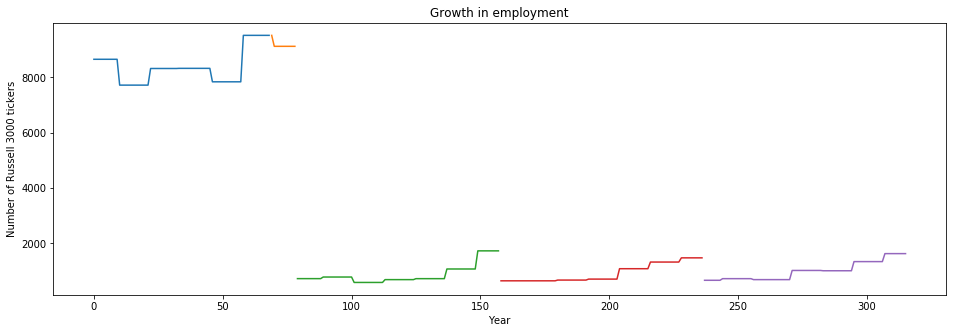

In [71]:
plot_data_growth_employment = data.groupby(['cl_company_legal_name_short'])['cl_current_employees_cnt']
plot_data_growth_employment.plot(kind='line', figsize=(16,5))
plt.title("Growth in employment")
plt.xlabel("Year")
plt.ylabel("Number of Russell 3000 tickers")

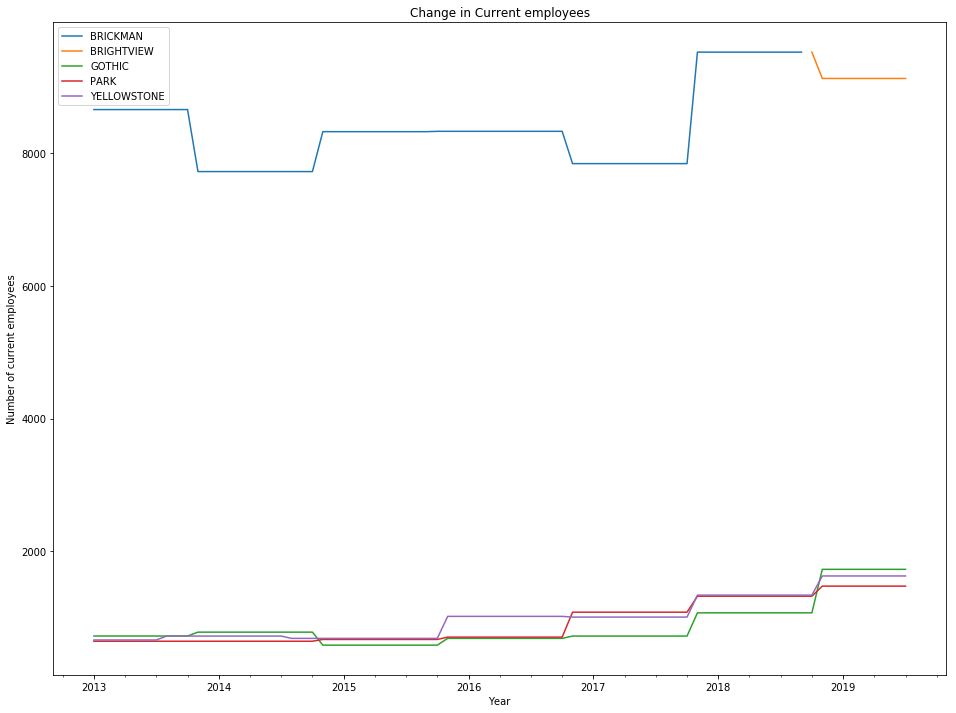

In [72]:
import pandas as pd
import seaborn as sns
import numpy as np

fig, ax = plt.subplots(figsize=(16,12))

for idx, gp in data.groupby('cl_company_legal_name_short'):
    gp.plot(x='datarun_date_parsed', y='cl_current_employees_cnt', ax=ax, label=idx)
plt.xlabel("Year")
plt.ylabel("Number of current employees")
plt.title("Change in Current employees")
plt.show()

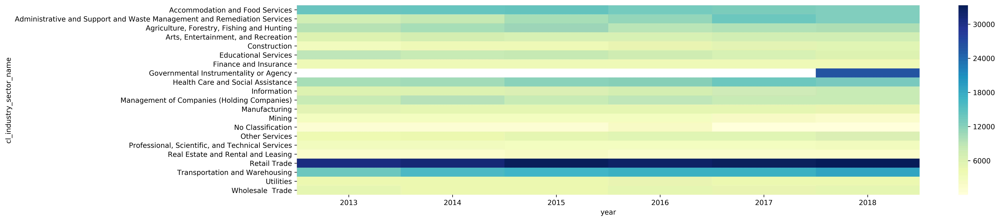

In [103]:
df = data[['cl_industry_sector_name','year','cl_current_employees_cnt']]
heatmap_data = pd.pivot_table(df,values='cl_current_employees_cnt', index=['cl_industry_sector_name'], columns='year')
sns.heatmap(heatmap_data, cmap="YlGnBu")

Text(0.5,1,'Number of companies by sector')

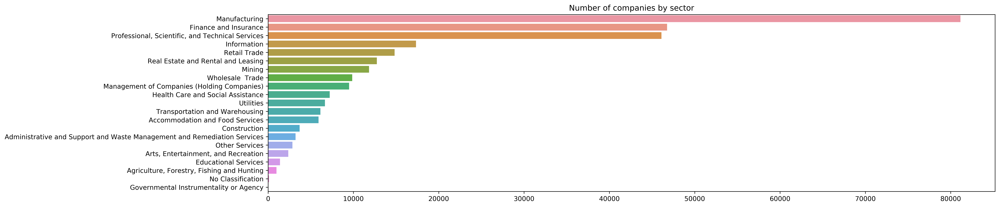

In [189]:
industry_frequency = data['cl_industry_sector_name'].value_counts()
b = sns.barplot(industry_frequency.values,industry_frequency.index)
plt.title("Number of companies by sector")

In [73]:
data['datarun_date_parsed'].describe()

count                  290641
unique                     72
top       2018-08-01 00:00:00
freq                     4142
first     2013-01-01 00:00:00
last      2018-12-01 00:00:00
Name: datarun_date_parsed, dtype: object

In [12]:
data['datarun_date_parsed'].head(10)

0    2013-06-01
1    2013-04-01
2    2013-01-01
3    2013-03-01
4    2014-02-01
5    2013-10-01
6    2013-08-01
7    2014-03-01
8    2014-04-01
9    2014-06-01
Name: datarun_date_parsed, dtype: object

In [37]:
data['datarun_date_parsed'].tail(10)

290631   2017-07-01
290632   2016-11-01
290633   2017-04-01
290634   2016-10-01
290635   2017-03-01
290636   2018-05-01
290637   2017-10-01
290638   2018-10-01
290639   2018-08-01
290640   2018-09-01
Name: datarun_date_parsed, dtype: datetime64[ns]

In [38]:
data['cl_current_employees_cnt'].head(10)

0    457.0
1    457.0
2    457.0
3    457.0
4    461.0
5    461.0
6    461.0
7    461.0
8    461.0
9    461.0
Name: cl_current_employees_cnt, dtype: float64

In [39]:
data['cl_current_employees_cnt'].tail(10)

290631    962.0
290632    962.0
290633    962.0
290634    962.0
290635    962.0
290636    929.0
290637    929.0
290638    926.0
290639    926.0
290640    926.0
Name: cl_current_employees_cnt, dtype: float64

In [40]:
data['change'] = data.cl_current_employees_cnt.pct_change()

In [105]:
data_RHT = data[data['russell_ticker']=='RHT']

In [58]:
data_RHT.head()

,ticker,ein,datarun_date_parsed,datarun_date,company_ein,cl_company_name,cl_company_legal_name,cl_company_common_name,cl_company_name_short,cl_company_legal_name_cleaned_ind,...,cl_growth_pens_partcp_contrib_per_partcp_2yr,cl_growth_pens_partcp_contrib_per_partcp_3yr,russell_ticker,russell_name,russell_date_next_first,russell_exchange,year,month,day,change
81307,RHT,61364380,2013-05-01,20130501,61364380,"RED HAT, INC.","RED HAT, INC.","RED HAT, INC.",RED HAT,0,...,NaN,NaN,RHT,RED HAT INC,2013-05-01,New York Stock Exchange Inc.,2013,5,1,-0.492985
81308,RHT,61364380,2013-03-01,20130301,61364380,"RED HAT, INC.","RED HAT, INC.","RED HAT, INC.",RED HAT,0,...,NaN,NaN,RHT,RED HAT INC,2013-03-01,New York Stock Exchange Inc.,2013,3,1,0.000000
81309,RHT,61364380,2013-01-01,20130101,61364380,"RED HAT, INC.","RED HAT, INC.","RED HAT, INC.",RED HAT,0,...,NaN,NaN,RHT,RED HAT INC,2013-01-01,New York Stock Exchange Inc.,2013,1,1,0.000000
81310,RHT,61364380,2013-06-01,20130601,61364380,"RED HAT, INC.","RED HAT, INC.","RED HAT, INC.",RED HAT,0,...,NaN,NaN,RHT,RED HAT INC,2013-06-01,New York Stock Exchange Inc.,2013,6,1,0.000000
81311,RHT,61364380,2014-03-01,20140301,61364380,"RED HAT, INC.","RED HAT, INC.","RED HAT, INC.",RED HAT,0,...,108.0,NaN,RHT,RED HAT INC,2014-03-01,New York Stock Exchange Inc.,2014,3,1,0.208969


In [106]:
data_RHT.datarun_date_parsed = pd.to_datetime(data_RHT.datarun_date_parsed)
data_RHT.set_index('datarun_date_parsed', inplace=True)

Text(0.5,0,'datarun_date_parsed')

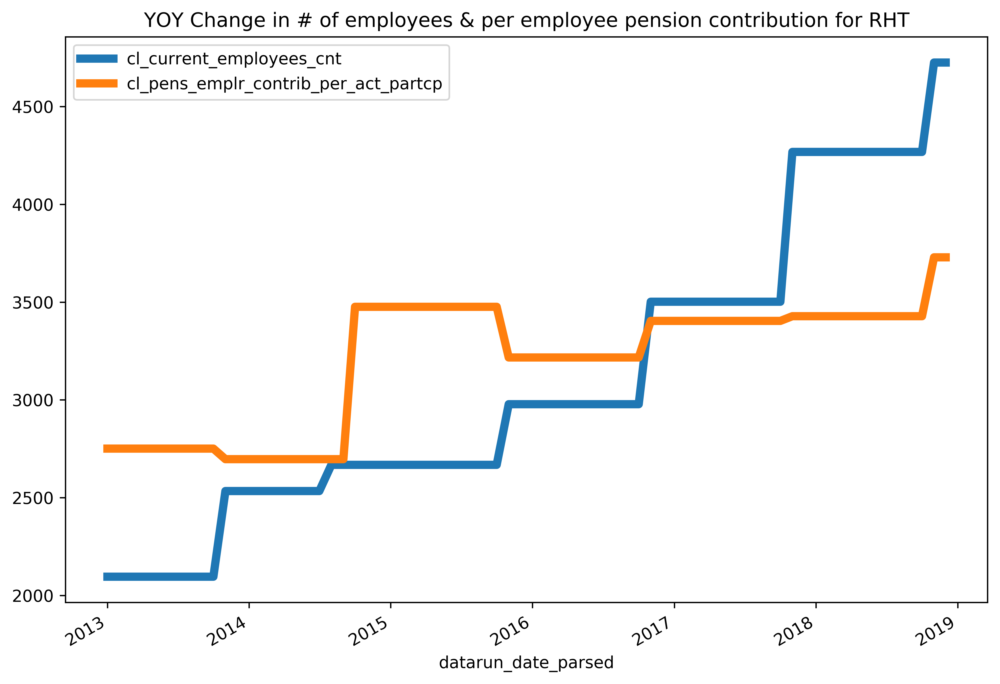

In [186]:
data_RHT[['cl_current_employees_cnt', 'cl_pens_emplr_contrib_per_act_partcp']].plot(figsize=(10,7), linewidth=5)
plt.title("YOY Change in # of employees & per employee pension contribution for RHT")
plt.xlabel('datarun_date_parsed')

Text(0.5,0,'datarun_date_parsed')

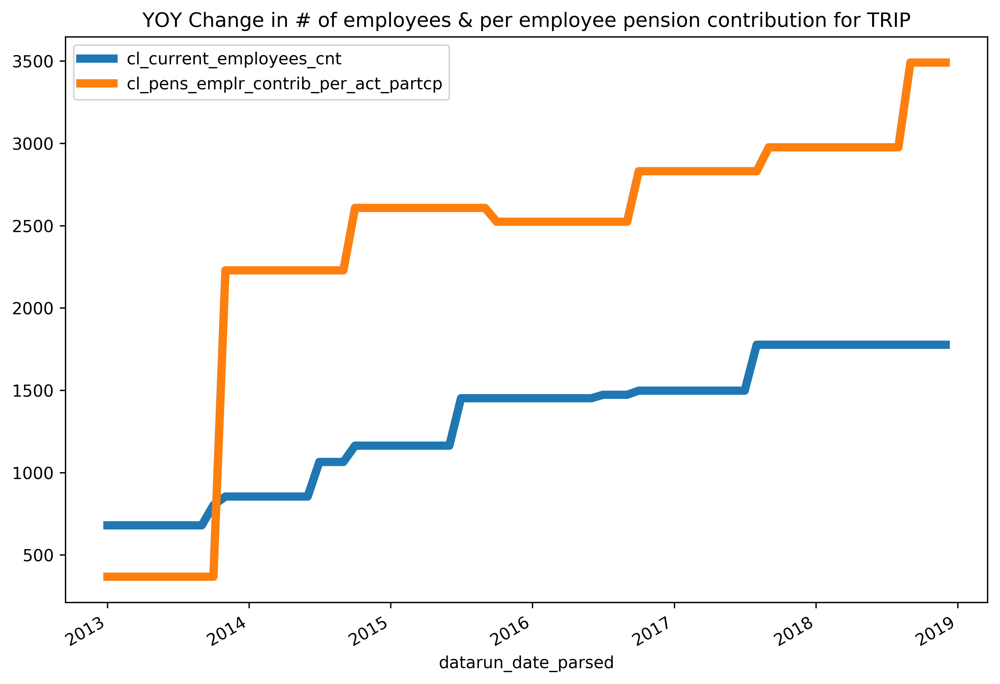

In [187]:
data_TRIP[['cl_current_employees_cnt', 'cl_pens_emplr_contrib_per_act_partcp']].plot(figsize=(10,7), linewidth=5)
plt.title("YOY Change in # of employees & per employee pension contribution for TRIP")
plt.xlabel('datarun_date_parsed')

Text(0.5,0,'datarun_date_parsed')

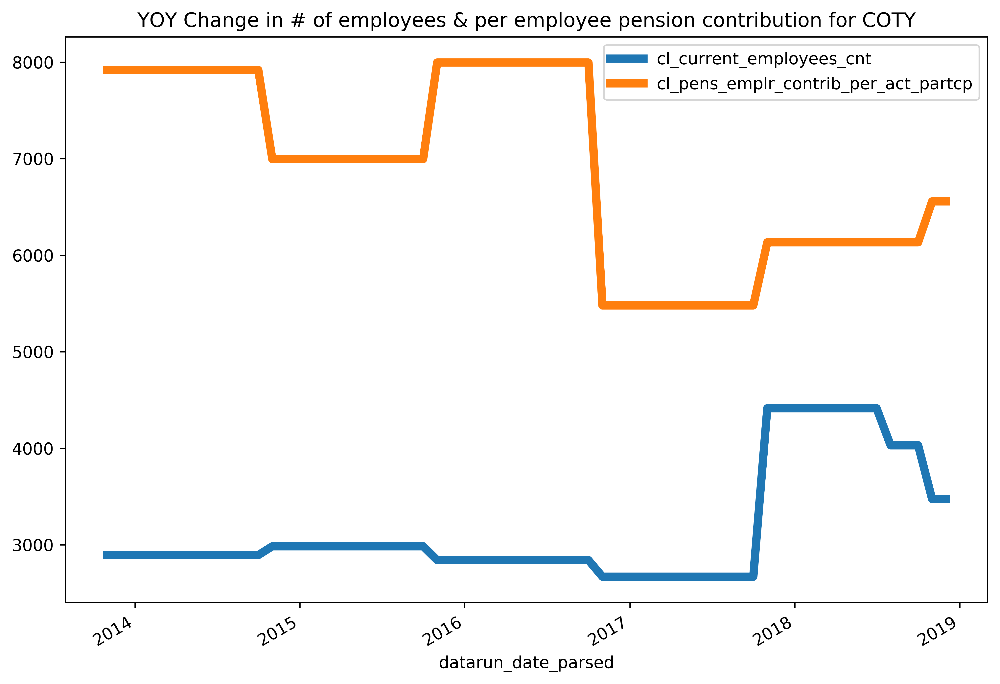

In [190]:
data_COTY[['cl_current_employees_cnt', 'cl_pens_emplr_contrib_per_act_partcp']].plot(figsize=(10,7), linewidth=5)
plt.title("YOY Change in # of employees & per employee pension contribution for COTY")
plt.xlabel('datarun_date_parsed')

Text(0.5,0,'datarun_date_parsed')

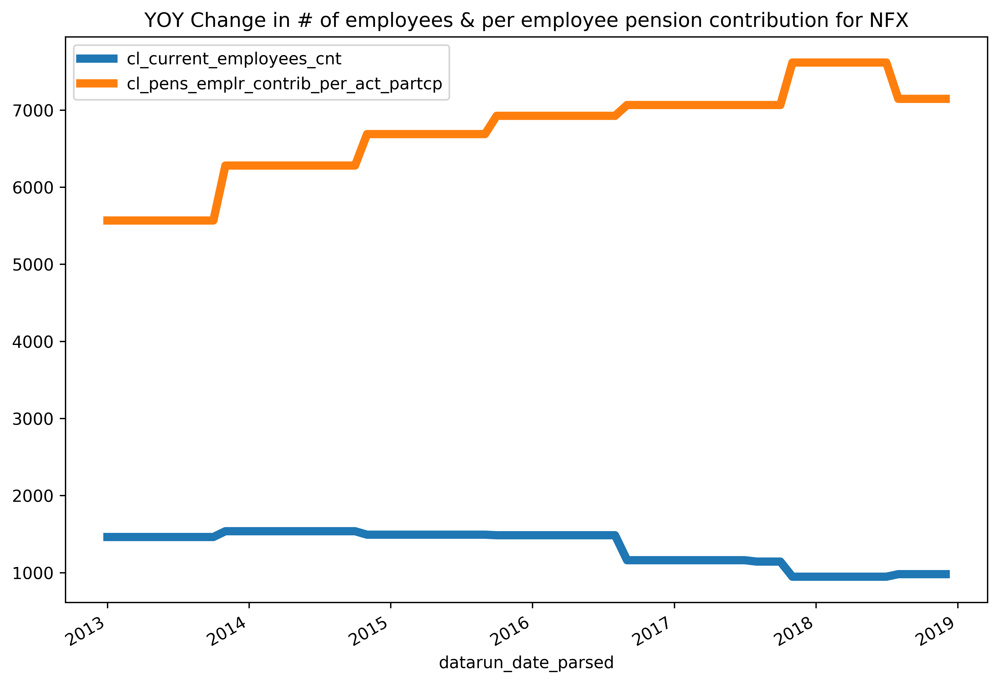

In [188]:
data_NFX[['cl_current_employees_cnt', 'cl_pens_emplr_contrib_per_act_partcp']].plot(figsize=(10,7), linewidth=5)
plt.title("YOY Change in # of employees & per employee pension contribution for NFX")
plt.xlabel('datarun_date_parsed')

Text(0.5,0,'datarun_date_parsed')

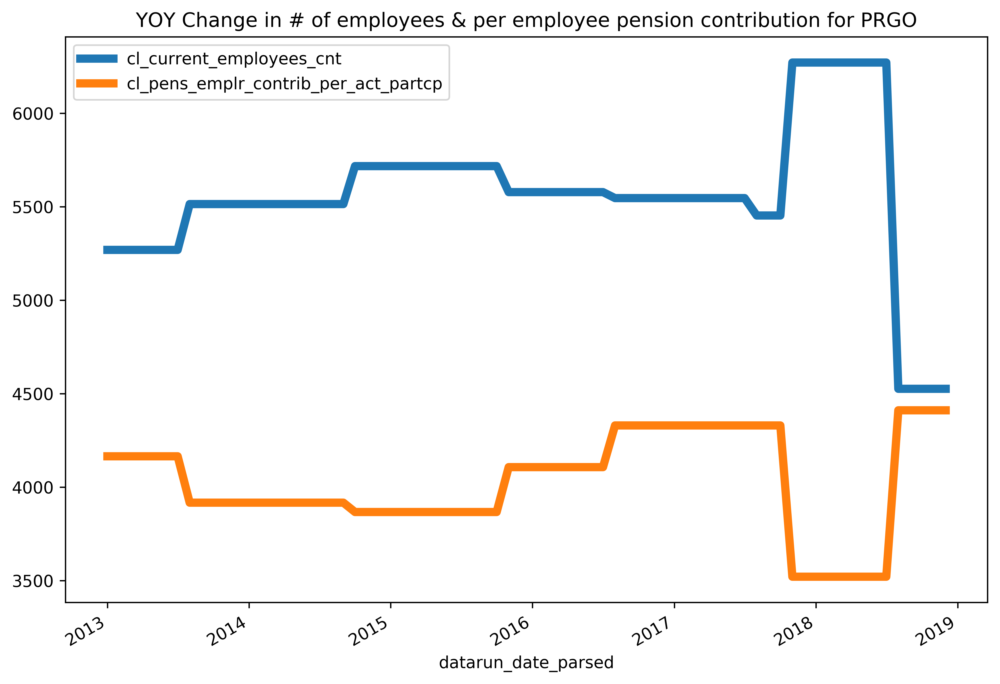

In [191]:
data_PRGO[['cl_current_employees_cnt', 'cl_pens_emplr_contrib_per_act_partcp']].plot(figsize=(10,7), linewidth=5)
plt.title("YOY Change in # of employees & per employee pension contribution for PRGO")
plt.xlabel('datarun_date_parsed')

In [108]:
data_AMD = data[data['russell_ticker']=='AMD']

In [109]:
data_AMD.datarun_date_parsed = pd.to_datetime(data_AMD.datarun_date_parsed)
data_AMD.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

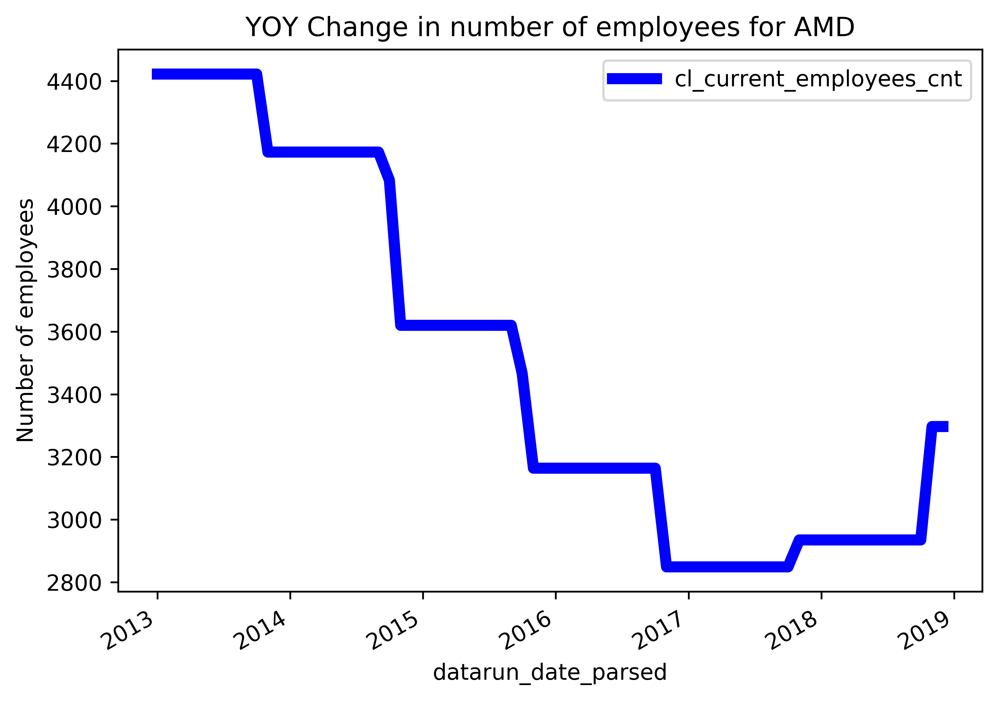

In [110]:
data_AMD[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='b')
plt.title("YOY Change in number of employees for AMD")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

Text(0,0.5,'company contributions per employee to pension plans')

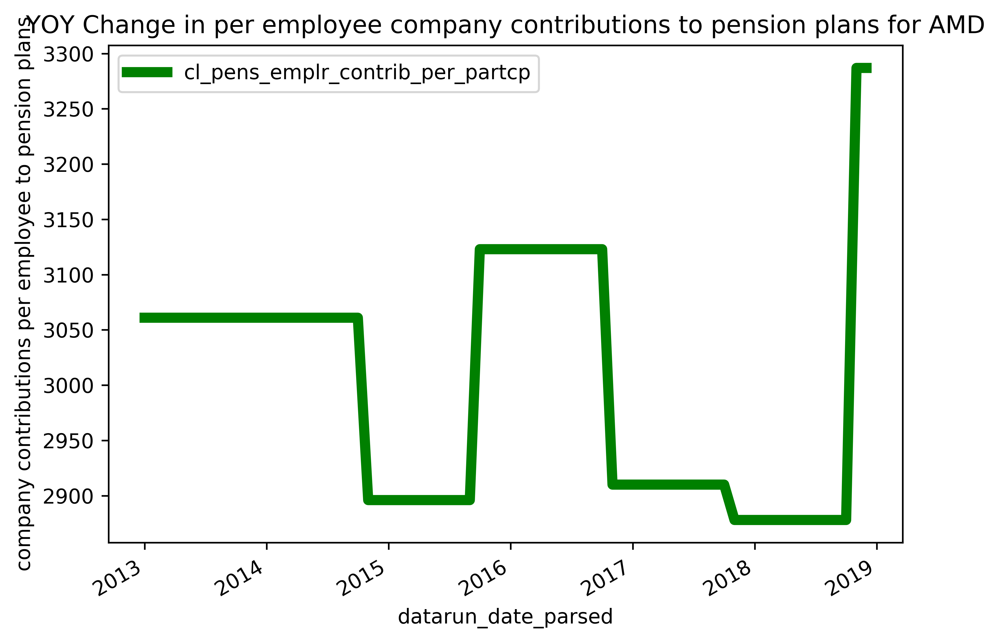

In [111]:
data_AMD[['cl_pens_emplr_contrib_per_partcp']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in per employee company contributions to pension plans for AMD")
plt.xlabel('datarun_date_parsed')
plt.ylabel("company contributions per employee to pension plans")

In [112]:
data_CMG = data[data['russell_ticker']=='CMG']

In [113]:
data_CMG.datarun_date_parsed = pd.to_datetime(data_CMG.datarun_date_parsed)
data_CMG.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

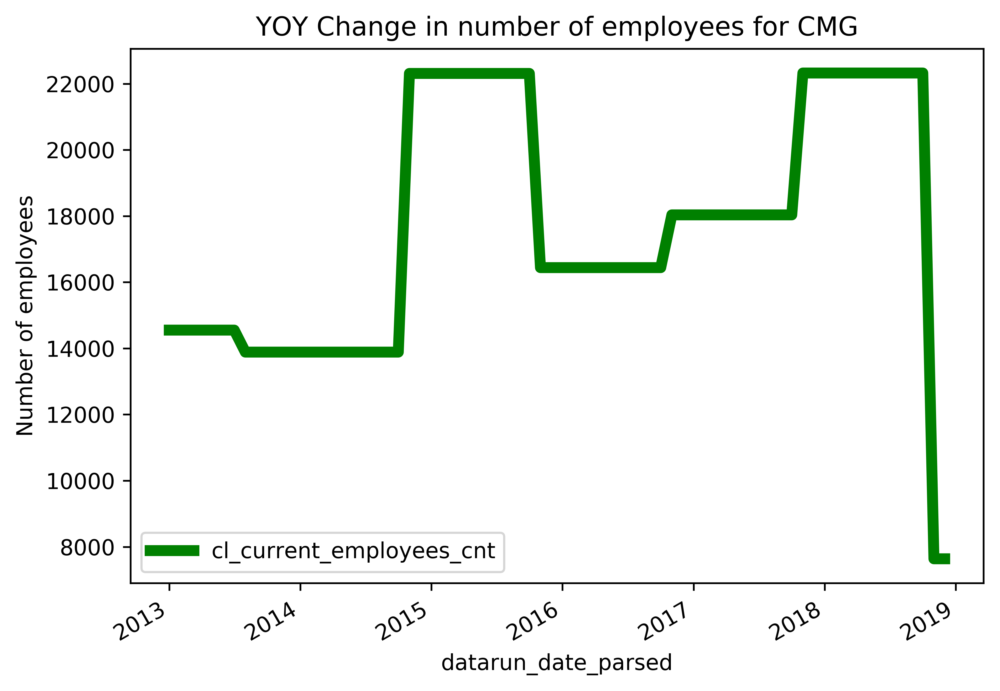

In [114]:
data_CMG[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in number of employees for CMG")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [115]:
data_AVYA = data[data['russell_ticker']=='AVYA']

In [116]:
data_AVYA.datarun_date_parsed = pd.to_datetime(data_AVYA.datarun_date_parsed)
data_AVYA.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

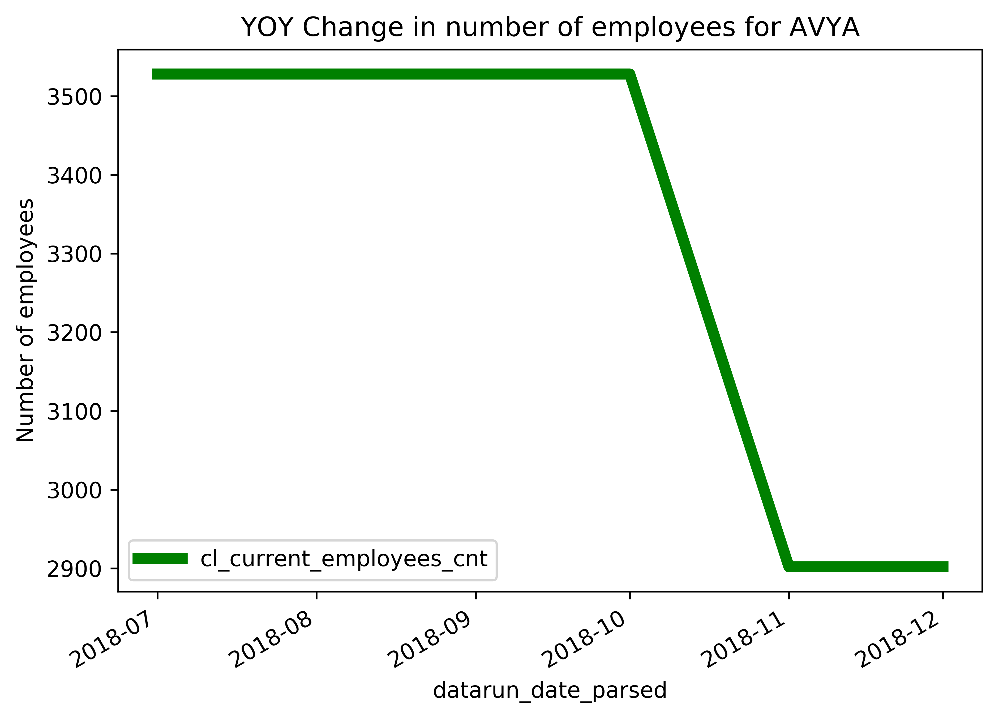

In [117]:
data_AVYA[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in number of employees for AVYA")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [118]:
data_ORLY = data[data['russell_ticker']=='ORLY']

In [119]:
data_ORLY.datarun_date_parsed = pd.to_datetime(data_ORLY.datarun_date_parsed)
data_ORLY.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

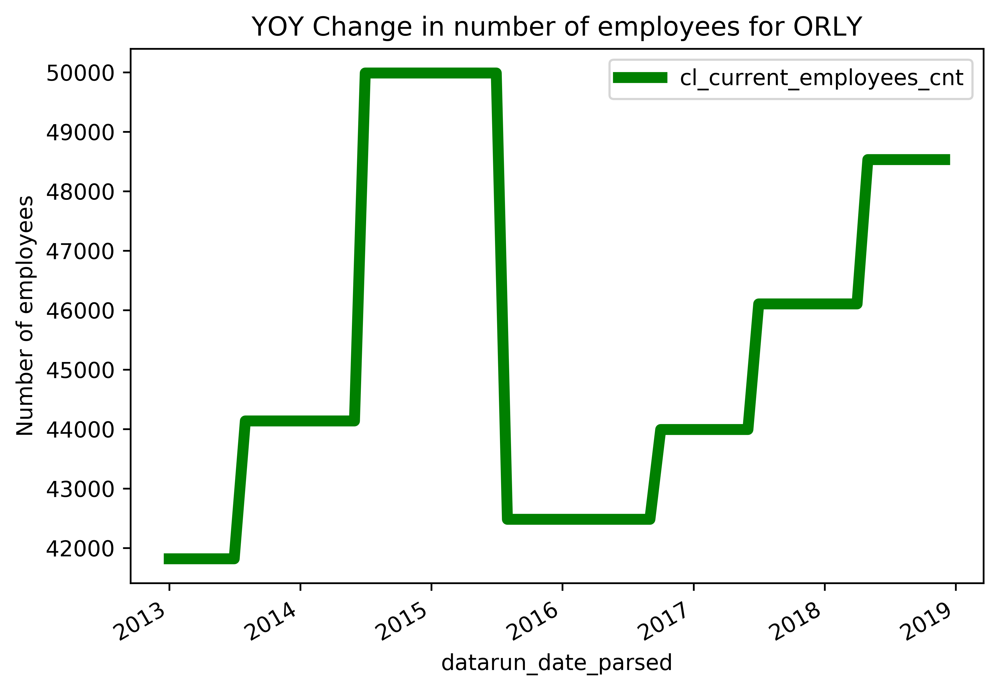

In [120]:
data_ORLY[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in number of employees for ORLY")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

Text(0,0.5,'company contributions per employee to pension plans')

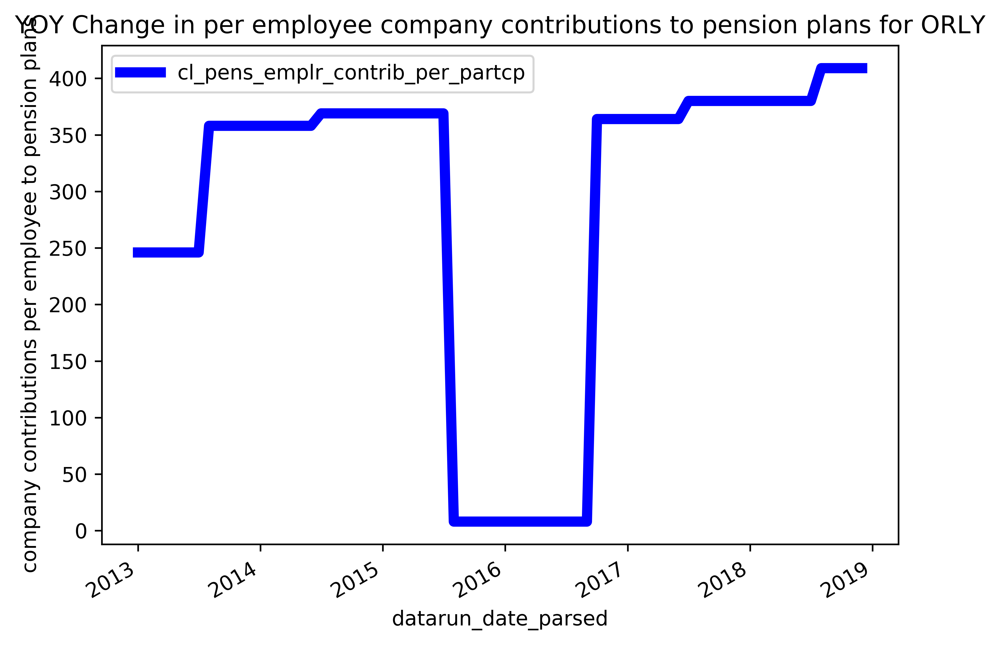

In [121]:
data_ORLY[['cl_pens_emplr_contrib_per_partcp']].plot(figsize=(7,5), linewidth=5, color='b')
plt.title("YOY Change in per employee company contributions to pension plans for ORLY")
plt.xlabel('datarun_date_parsed')
plt.ylabel("company contributions per employee to pension plans")

In [122]:
data_ABMD = data[data['russell_ticker']=='ABMD']

In [123]:
data_ABMD.datarun_date_parsed = pd.to_datetime(data_ABMD.datarun_date_parsed)
data_ABMD.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

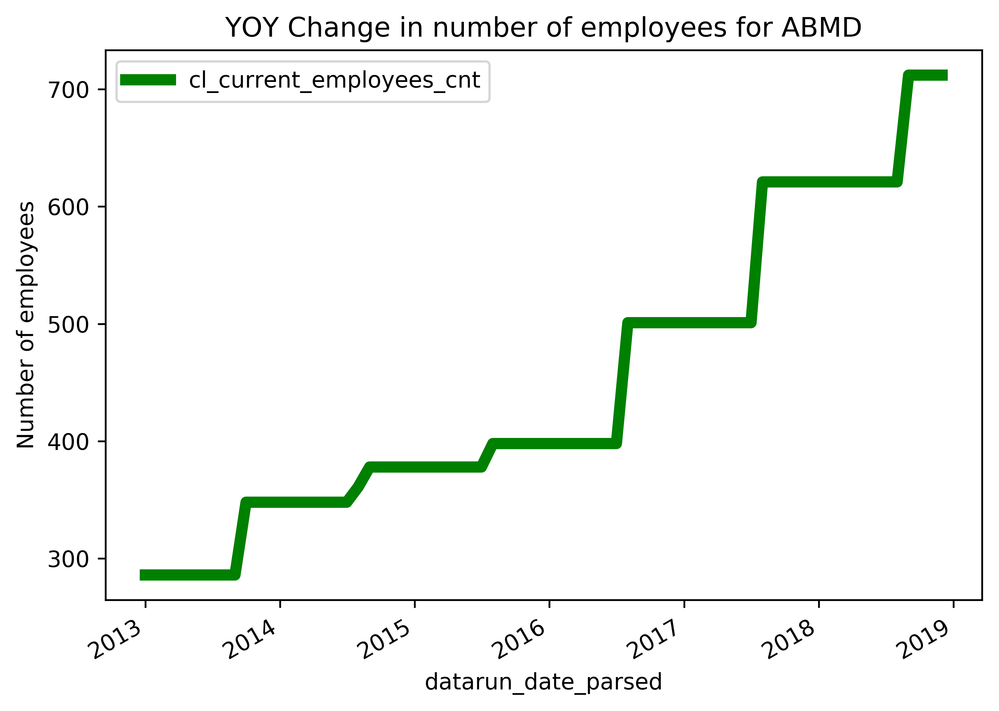

In [124]:
data_ABMD[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in number of employees for ABMD")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

Text(0,0.5,'company contributions per employee to pension plans')

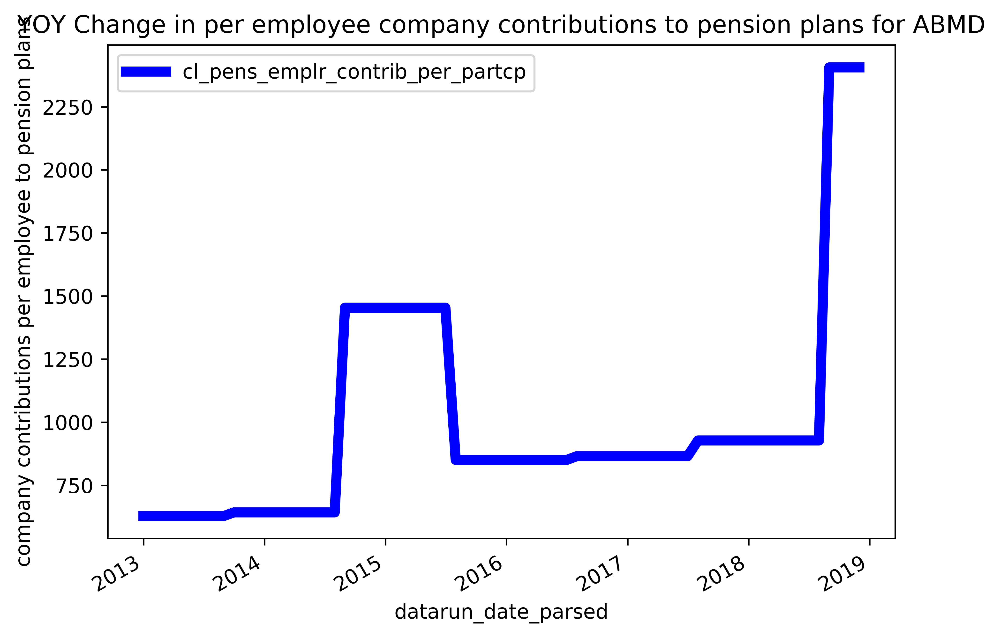

In [125]:
data_ABMD[['cl_pens_emplr_contrib_per_partcp']].plot(figsize=(7,5), linewidth=5, color='b')
plt.title("YOY Change in per employee company contributions to pension plans for ABMD")
plt.xlabel('datarun_date_parsed')
plt.ylabel("company contributions per employee to pension plans")

In [126]:
data_KEYS = data[data['russell_ticker']=='KEYS']

In [127]:
data_KEYS.datarun_date_parsed = pd.to_datetime(data_KEYS.datarun_date_parsed)
data_KEYS.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

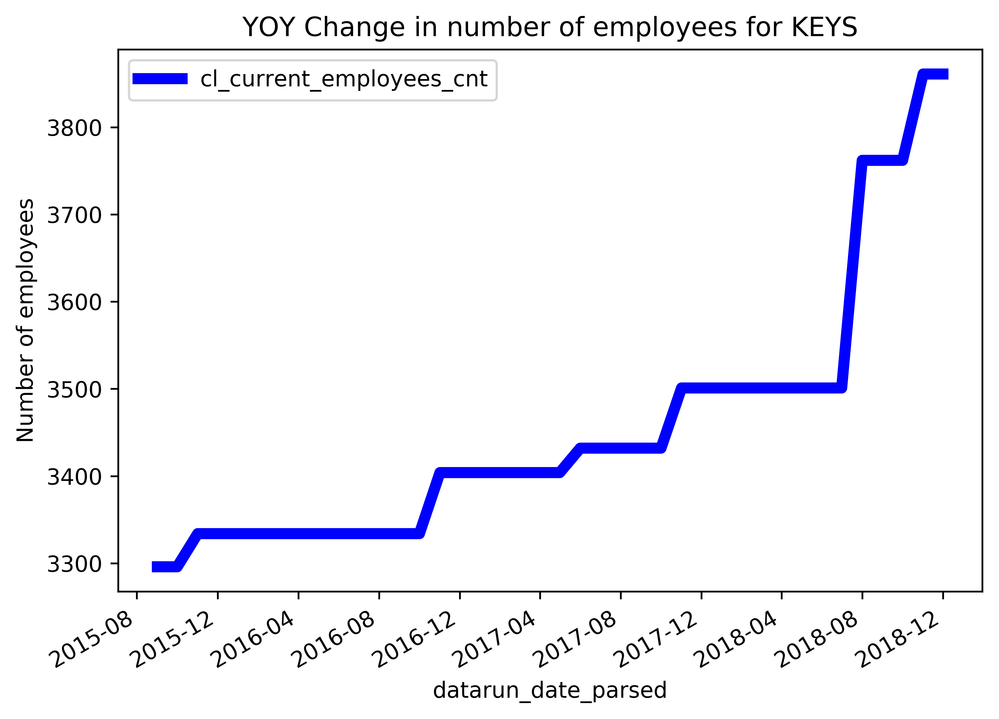

In [128]:
data_KEYS[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='b')
plt.title("YOY Change in number of employees for KEYS")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

Text(0,0.5,'company contributions per employee to pension plans')

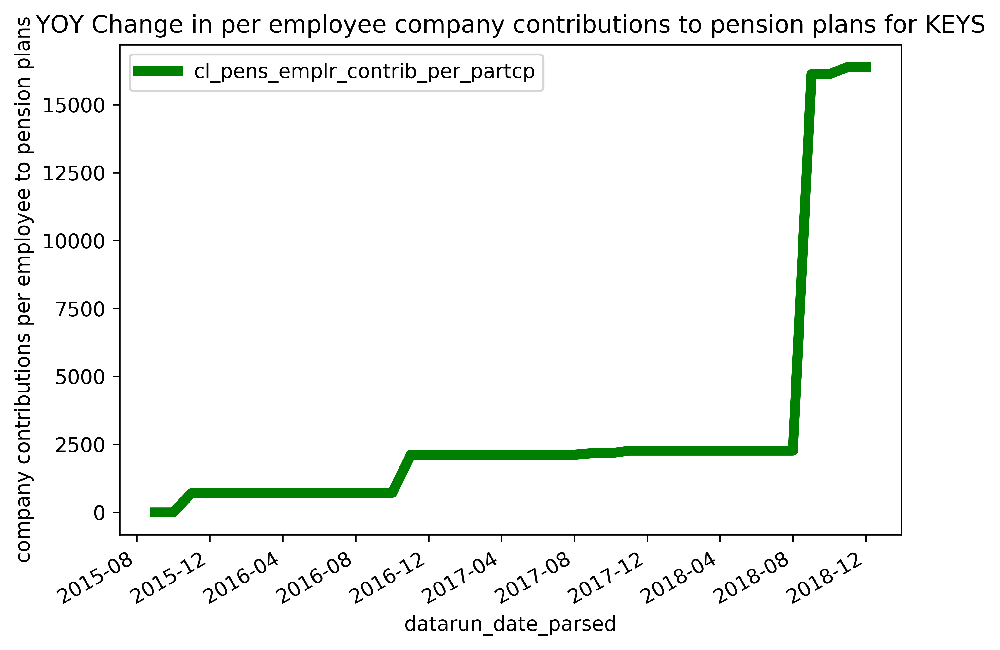

In [129]:
data_KEYS[['cl_pens_emplr_contrib_per_partcp']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in per employee company contributions to pension plans for KEYS")
plt.xlabel('datarun_date_parsed')
plt.ylabel("company contributions per employee to pension plans")

In [130]:
data_TRIP = data[data['russell_ticker']=='TRIP']

In [131]:
data_TRIP.datarun_date_parsed = pd.to_datetime(data_TRIP.datarun_date_parsed)
data_TRIP.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

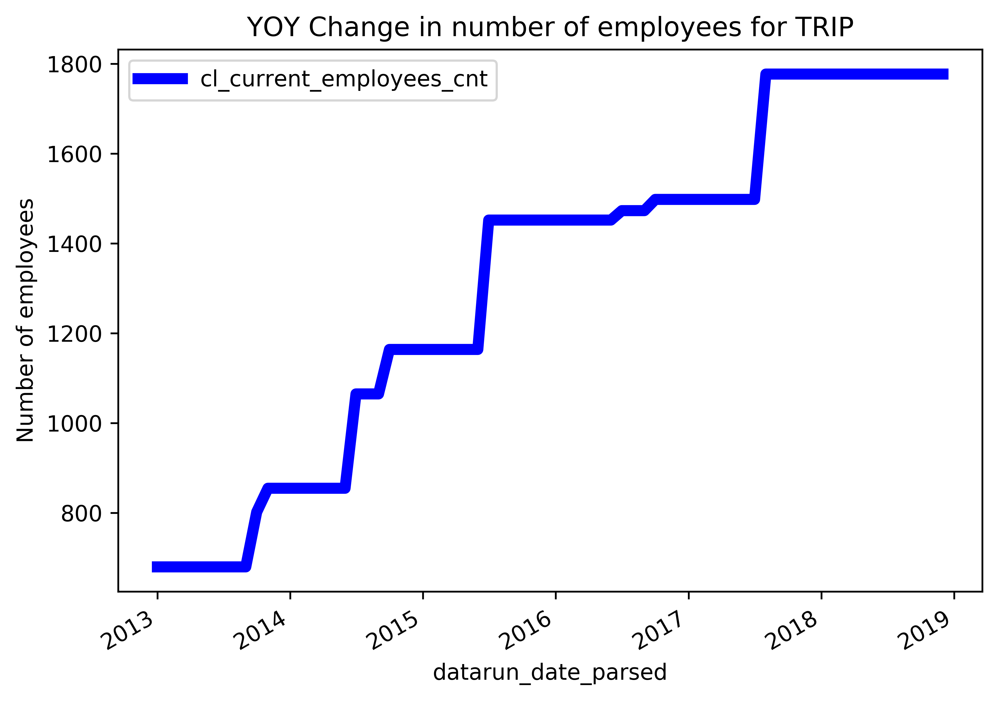

In [132]:
data_TRIP[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='b')
plt.title("YOY Change in number of employees for TRIP")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

Text(0,0.5,'company contributions per employee to pension plans')

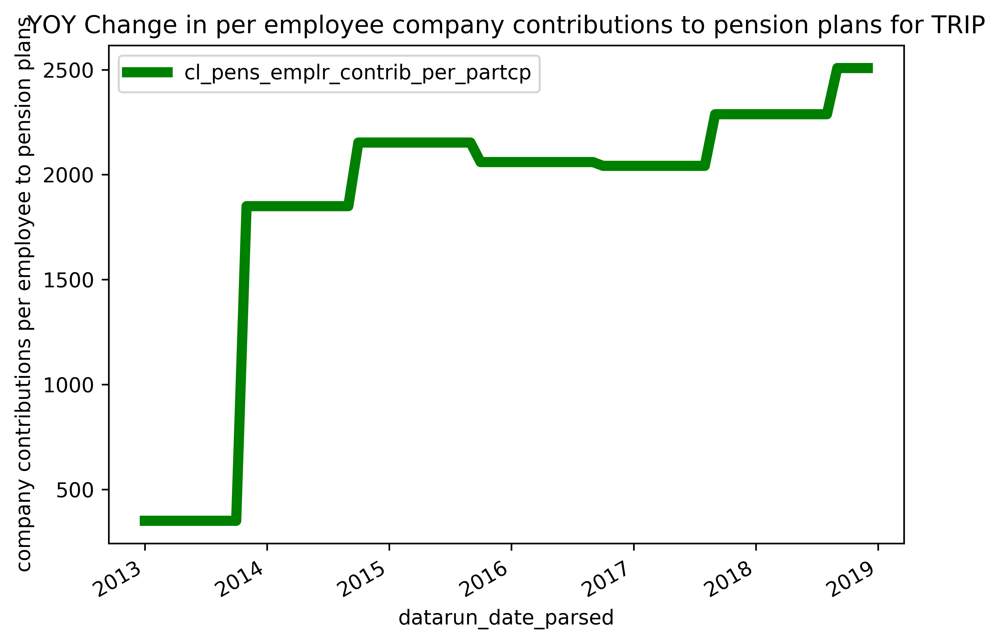

In [133]:
data_TRIP[['cl_pens_emplr_contrib_per_partcp']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in per employee company contributions to pension plans for TRIP")
plt.xlabel('datarun_date_parsed')
plt.ylabel("company contributions per employee to pension plans")

In [134]:
data_WDC = data[data['russell_ticker']=='WDC']

In [135]:
data_WDC.datarun_date_parsed = pd.to_datetime(data_WDC.datarun_date_parsed)
data_WDC.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

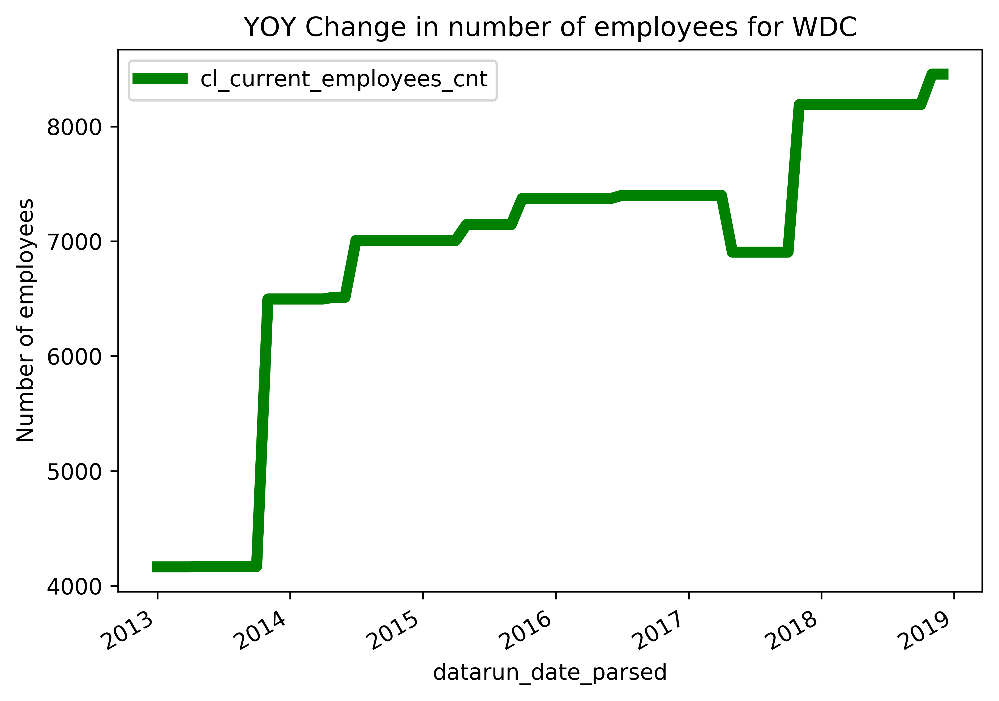

In [136]:
data_WDC[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in number of employees for WDC")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [137]:
data_COTY = data[data['russell_ticker']=='COTY']

In [138]:
data_COTY.datarun_date_parsed = pd.to_datetime(data_COTY.datarun_date_parsed)
data_COTY.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

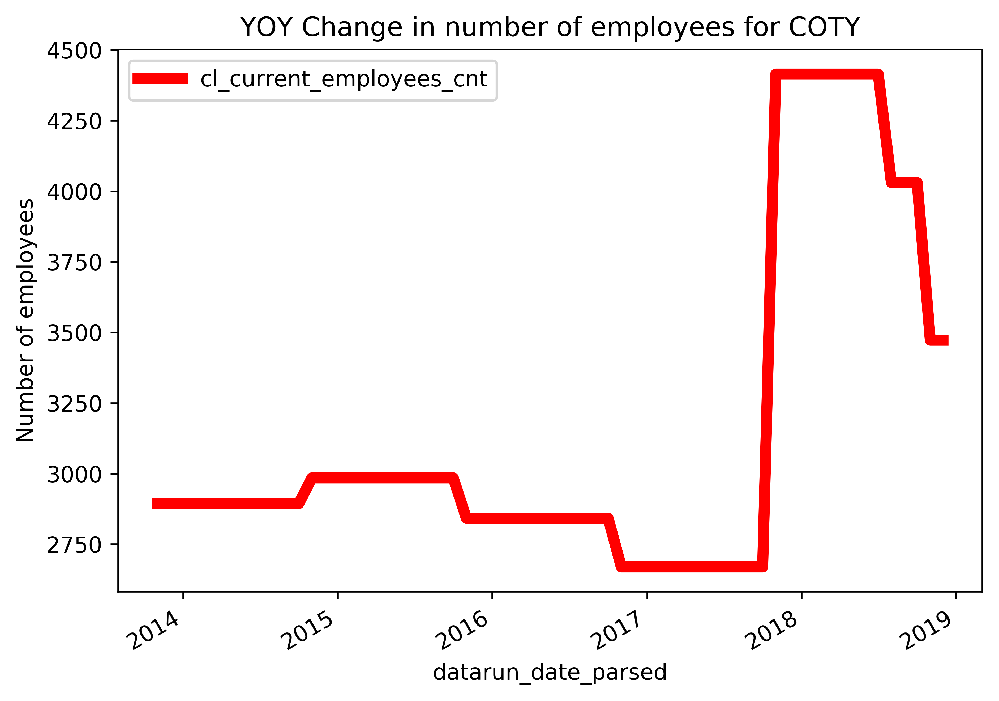

In [139]:
data_COTY[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='r')
plt.title("YOY Change in number of employees for COTY")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

Text(0,0.5,'company contributions per employee to pension plans')

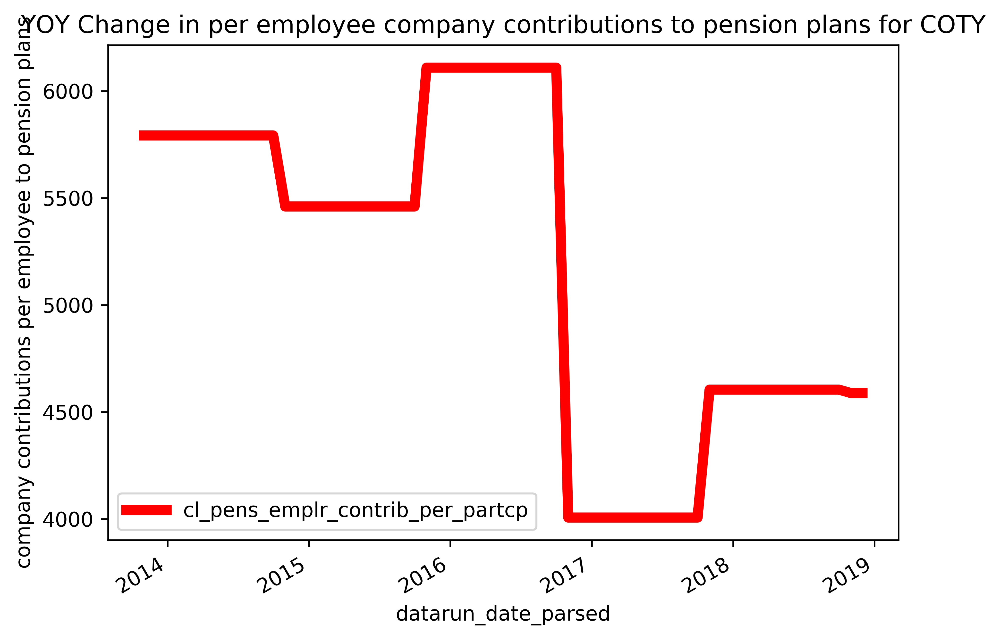

In [140]:
data_COTY[['cl_pens_emplr_contrib_per_partcp']].plot(figsize=(7,5), linewidth=5, color='r')
plt.title("YOY Change in per employee company contributions to pension plans for COTY")
plt.xlabel('datarun_date_parsed')
plt.ylabel("company contributions per employee to pension plans")

In [141]:
data_GE = data[data['russell_ticker']=='GE']

In [142]:
data_GE.datarun_date_parsed = pd.to_datetime(data_GE.datarun_date_parsed)
data_GE.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

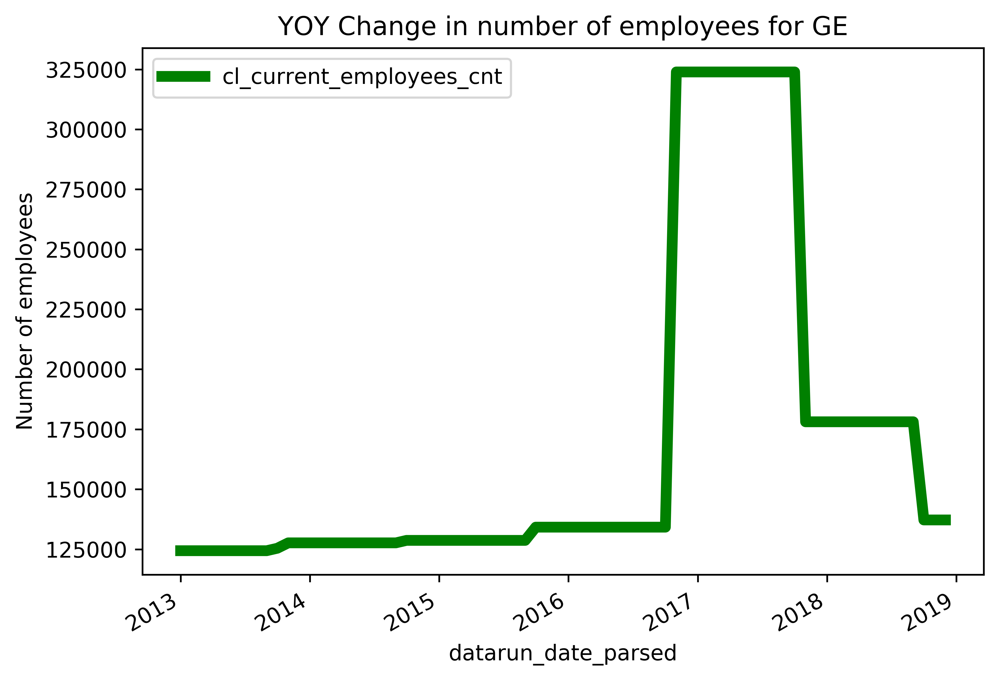

In [143]:
data_GE[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='g')
plt.title("YOY Change in number of employees for GE")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [144]:
data_NFX = data[data['russell_ticker']=='NFX']

In [145]:
data_NFX.datarun_date_parsed = pd.to_datetime(data_NFX.datarun_date_parsed)
data_NFX.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

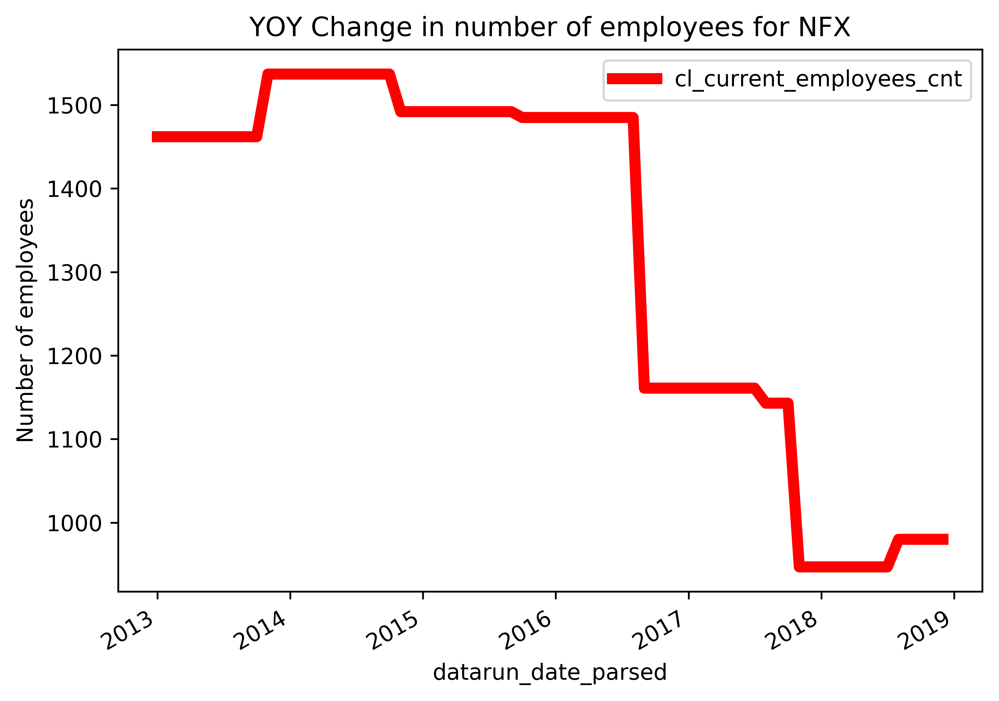

In [146]:
data_NFX[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='r')
plt.title("YOY Change in number of employees for NFX")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [ ]:
data_NFX[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='r')
plt.title("YOY Change in number of employees for NFX")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [147]:
data_PRGO = data[data['russell_ticker']=='PRGO']

In [148]:
data_PRGO.datarun_date_parsed = pd.to_datetime(data_PRGO.datarun_date_parsed)
data_PRGO.set_index('datarun_date_parsed', inplace=True)

Text(0,0.5,'Number of employees')

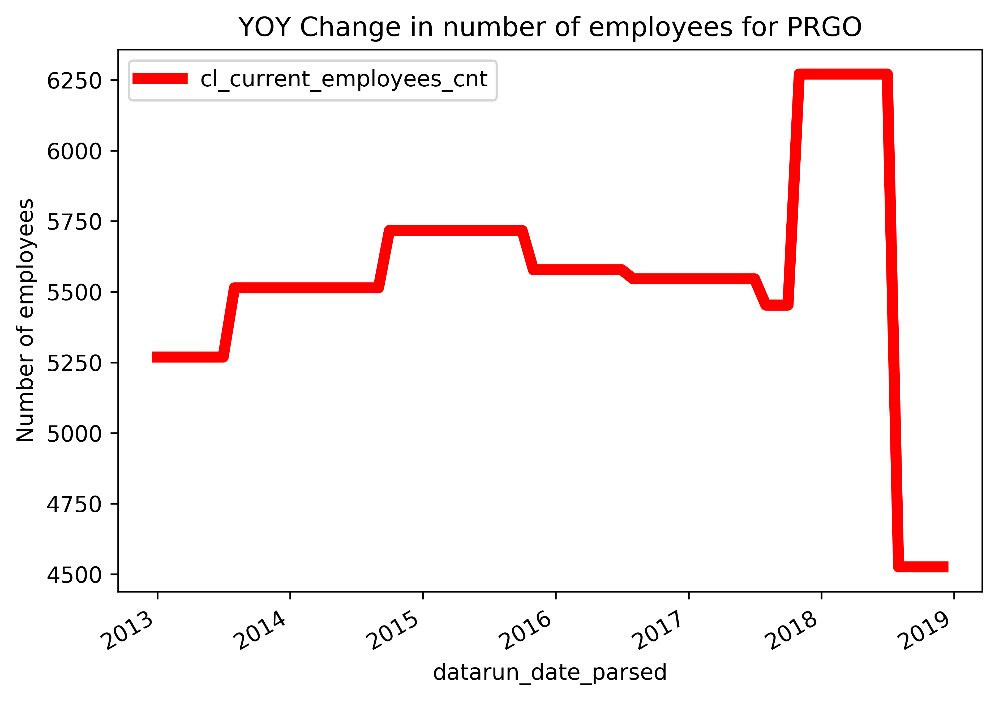

In [149]:
data_PRGO[['cl_current_employees_cnt']].plot(figsize=(7,5), linewidth=5, color='r')
plt.title("YOY Change in number of employees for PRGO")
plt.xlabel('datarun_date_parsed')
plt.ylabel("Number of employees")

In [150]:
data_slice = data[['russell_ticker', 'datarun_date_parsed', 'cl_current_employees_cnt']]

In [151]:
data_slice.head()

,russell_ticker,datarun_date_parsed,cl_current_employees_cnt
0,UTL,2013-06-01,457.0
1,UTL,2013-04-01,457.0
2,UTL,2013-01-01,457.0
3,UTL,2013-03-01,457.0
4,UTL,2014-02-01,461.0


In [152]:
data_slice['change'] = data_slice.cl_current_employees_cnt.pct_change()

In [153]:
data_slice['year'] = data_slice['datarun_date_parsed'].dt.year
data_slice['month'] = data_slice['datarun_date_parsed'].dt.month
data_slice['day'] = data_slice['datarun_date_parsed'].dt.day

In [ ]:
plot_data_slice_year = data['cl_current_employees_cnt'].groupby([data['russell_ticker', 'RHT']]).agg(['count'])

In [156]:
data['ticker'].head()

0    UTL
1    UTL
2    UTL
3    UTL
4    UTL
Name: ticker, dtype: object

In [157]:
data['ticker'].tail(10)

290631    CPF
290632    CPF
290633    CPF
290634    CPF
290635    CPF
290636    CPF
290637    CPF
290638    CPF
290639    CPF
290640    CPF
Name: ticker, dtype: object

In [158]:
print (data['datarun_date_parsed'].dtype)

datetime64[ns]


In [159]:
data['datarun_date_parsed'] = pd.to_datetime(data['datarun_date_parsed'])

In [160]:
print (data['datarun_date_parsed'].dtype)

datetime64[ns]


In [161]:
data['year'] = data['datarun_date_parsed'].dt.year
data['month'] = data['datarun_date_parsed'].dt.month
data['day'] = data['datarun_date_parsed'].dt.day

In [162]:
data['year'].head()

0    2013
1    2013
2    2013
3    2013
4    2014
Name: year, dtype: int64

In [163]:
plot_data_year = data['russell_ticker'].groupby([data['year']]).agg(['count'])

Text(0,0.5,'Number of Russell 3000 tickers')

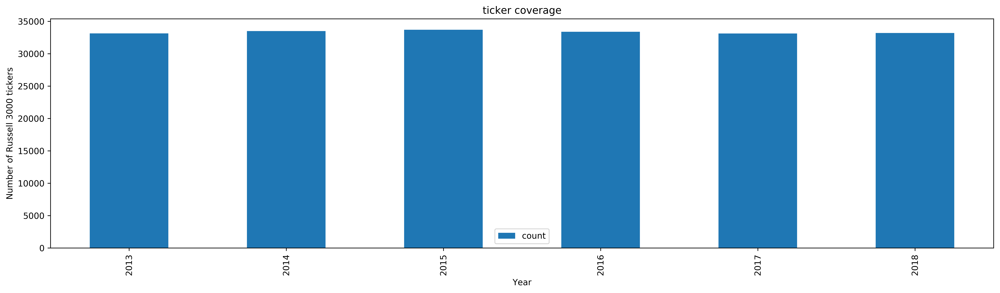

In [164]:
plot_data_year.plot(kind='bar')
plt.title("ticker coverage")
plt.xlabel("Year")
plt.ylabel("Number of Russell 3000 tickers")

In [165]:
plot_data_year_month_all = data.groupby(['year', 'month'])['ticker'].count()

In [166]:
plot_data_year_month_all.head()

year  month
2013  1        3866
      2        3866
      3        3867
      4        3870
      5        3872
Name: ticker, dtype: int64

In [167]:
plot_data_year_month_all.tail()

year  month
2018  8        4142
      9        4139
      10       4138
      11       4130
      12       4130
Name: ticker, dtype: int64

Text(0,0.5,'Number of Russell 3000 tickers')

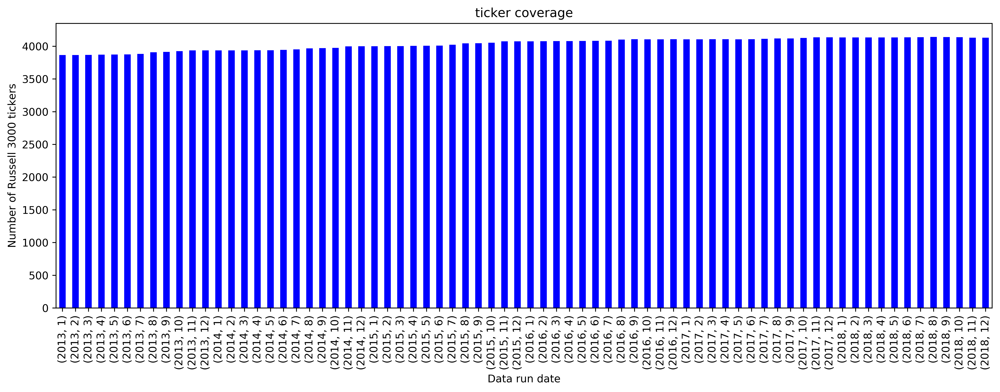

In [178]:
plot_data_year_month_all.plot(kind='bar', figsize=(16,5), color='b')
plt.title("ticker coverage")
plt.xlabel("Data run date")
plt.ylabel("Number of Russell 3000 tickers")

In [169]:
plot_data_year_month_russell = data.groupby(['year', 'month'])['russell_ticker'].count()

In [170]:
plot_data_year_month_russell.head()

year  month
2013  1        2765
      2        2761
      3        2750
      4        2741
      5        2745
Name: russell_ticker, dtype: int64

In [171]:
plot_data_year_month_russell.tail()

year  month
2018  8        2789
      9        2779
      10       2811
      11       2799
      12       2787
Name: russell_ticker, dtype: int64

Text(0,0.5,'Number of Russell 3000 tickers')

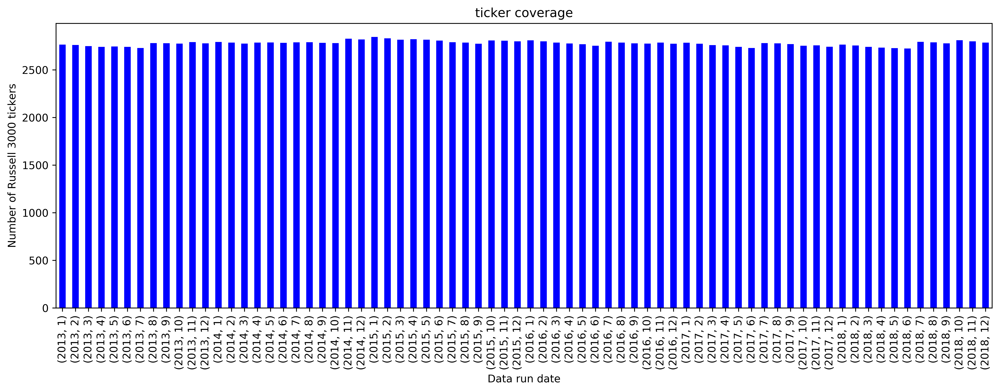

In [173]:
plot_data_year_month_russell.plot(kind='bar', width=0.5, color='b', figsize=(16,5))
plt.title("ticker coverage")
plt.xlabel("Data run date")
plt.ylabel("Number of Russell 3000 tickers")

In [31]:
esg_data = pd.read_csv(r"C:\Users\paro\Desktop\Axiomatic_public_company_historical_datasets\cl_companies_ESG_indicators_russell_from_historical_v4.csv")

In [32]:
esg_data.head()

,ticker,ein,datarun_date_parsed,datarun_date,company_ein,cl_company_name,cl_company_legal_name,cl_company_common_name,cl_company_name_short,cl_company_legal_name_cleaned_ind,...,cl_growth_pens_partcp_contrib_per_act_partcp_1yr,cl_growth_pens_partcp_contrib_per_act_partcp_2yr,cl_growth_pens_partcp_contrib_per_act_partcp_3yr,cl_growth_pens_partcp_contrib_per_partcp_1yr,cl_growth_pens_partcp_contrib_per_partcp_2yr,cl_growth_pens_partcp_contrib_per_partcp_3yr,russell_ticker,russell_name,russell_date_next_first,russell_exchange
0,UTL,20383661,2013-06-01,20130601,20383661,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL,0,...,101.0,NaN,NaN,106.0,NaN,NaN,UTL,UNITIL CORP,2013-06-01,New York Stock Exchange Inc.
1,UTL,20383661,2013-01-01,20130101,20383661,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL,0,...,101.0,NaN,NaN,106.0,NaN,NaN,UTL,UNITIL CORP,2013-01-01,New York Stock Exchange Inc.
2,UTL,20383661,2013-04-01,20130401,20383661,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL,0,...,101.0,NaN,NaN,106.0,NaN,NaN,UTL,UNITIL CORP,2013-04-01,New York Stock Exchange Inc.
3,UTL,20383661,2013-03-01,20130301,20383661,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL,0,...,101.0,NaN,NaN,106.0,NaN,NaN,UTL,UNITIL CORP,2013-03-01,New York Stock Exchange Inc.
4,UTL,20383661,2013-02-01,20130201,20383661,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL SERVICE CORP.,UNITIL,0,...,101.0,NaN,NaN,106.0,NaN,NaN,UTL,UNITIL CORP,2013-02-01,New York Stock Exchange Inc.


In [33]:
esg_data.describe()

,ein,datarun_date,company_ein,cl_company_legal_name_cleaned_ind,cl_industry_code,cl_industry_sub_sector_code,cl_industry_sector_code,cl_company_phone,cl_longitudinal_linkage_absorbed_ind,cl_longitudinal_linkage_absorber_ind,...,cl_growth_pens_contrib_per_act_partcp_3yr,cl_growth_pens_contrib_per_partcp_1yr,cl_growth_pens_contrib_per_partcp_2yr,cl_growth_pens_contrib_per_partcp_3yr,cl_growth_pens_partcp_contrib_per_act_partcp_1yr,cl_growth_pens_partcp_contrib_per_act_partcp_2yr,cl_growth_pens_partcp_contrib_per_act_partcp_3yr,cl_growth_pens_partcp_contrib_per_partcp_1yr,cl_growth_pens_partcp_contrib_per_partcp_2yr,cl_growth_pens_partcp_contrib_per_partcp_3yr
count,2.000560e+05,2.000560e+05,2.000560e+05,200056.000000,200056.000000,200056.000000,200056.000000,2.000290e+05,200056.0,200056.000000,...,137707.000000,194487.000000,172105.000000,137827.000000,194356.000000,171985.000000,137707.000000,194487.000000,172105.000000,137827.000000
mean,4.646446e+08,2.015562e+07,4.646446e+08,0.000575,448163.401997,4477.965570,43.994477,5.752396e+09,0.0,0.129364,...,105.049191,114.530997,105.842067,104.634542,112.231951,105.892055,105.216946,112.047988,105.450312,104.834699
std,2.828848e+08,1.704869e+04,2.828848e+08,0.023969,127164.968968,1273.612527,13.223682,2.429351e+09,0.0,0.335603,...,21.474259,470.658083,32.581407,21.557427,361.926937,30.033959,20.095463,409.274792,31.331687,20.804197
min,1.006781e+07,2.013010e+07,1.006781e+07,0.000000,111100.000000,1110.000000,11.000000,2.012229e+09,0.0,0.000000,...,-100.000000,-100.000000,-100.000000,-100.000000,-100.000000,-100.000000,-100.000000,-100.000000,-100.000000,-100.000000
25%,2.233413e+08,2.014070e+07,2.233413e+08,0.000000,334410.000000,3340.000000,31.000000,3.366268e+09,0.0,0.000000,...,99.000000,97.000000,98.000000,98.000000,100.000000,100.000000,101.000000,99.000000,100.000000,100.000000
50%,4.103200e+08,2.015120e+07,4.103200e+08,0.000000,512100.000000,5120.000000,51.000000,6.105943e+09,0.0,0.000000,...,104.000000,103.000000,104.000000,104.000000,104.000000,105.000000,105.000000,103.000000,104.000000,104.000000
75%,7.406079e+08,2.017060e+07,7.406079e+08,0.000000,541214.000000,5412.000000,54.000000,7.877717e+09,0.0,0.000000,...,110.000000,112.000000,111.000000,110.000000,111.000000,110.000000,109.000000,110.000000,109.000000,109.000000
max,9.903752e+08,2.018120e+07,9.903752e+08,1.000000,999999.000000,9990.000000,99.000000,9.898395e+09,0.0,1.000000,...,987.000000,87667.000000,3404.000000,1079.000000,66883.000000,3422.000000,1046.000000,75525.000000,3814.000000,1166.000000


In [34]:
esg_data['datarun_date_parsed'] = pd.to_datetime(esg_data['datarun_date_parsed'])

In [35]:
esg_data['year'] = esg_data['datarun_date_parsed'].dt.year
esg_data['month'] = esg_data['datarun_date_parsed'].dt.month
esg_data['day'] = esg_data['datarun_date_parsed'].dt.day

In [174]:
data_AMD_w_price=pd.read_csv(r"C:\Users\paro\Desktop\Axiomatic_public_company_historical_datasets\cl_companies_AMD_with_stock_price_adj_close.csv")

In [175]:
data_AMD_w_price.head()

,ticker,ein,datarun_date_parsed,cl_current_employees_cnt,cl_pens_emplr_contrib_per_act_partcp,stock_price_adj_close,datarun_date_parsed.1,date og_stock+prices,stock_price_adj_close.1,datarun_date,...,cl_growth_pens_partcp_contrib_per_act_partcp_1yr,cl_growth_pens_partcp_contrib_per_act_partcp_2yr,cl_growth_pens_partcp_contrib_per_act_partcp_3yr,cl_growth_pens_partcp_contrib_per_partcp_1yr,cl_growth_pens_partcp_contrib_per_partcp_2yr,cl_growth_pens_partcp_contrib_per_partcp_3yr,russell_ticker,russell_name,russell_date_next_first,russell_exchange
0,AMD,941692300,2/1/2013,4422,4870,2.49,2/1/2013,2/1/2013,2.49,20130201,...,109,NaN,NaN,105,NaN,NaN,AMD,ADVANCED MICRO DEVICES INC,2/1/2013,NASDAQ
1,AMD,941692300,4/1/2013,4422,4870,2.82,4/1/2013,4/1/2013,2.82,20130401,...,109,NaN,NaN,105,NaN,NaN,AMD,ADVANCED MICRO DEVICES INC,4/1/2013,NASDAQ
2,AMD,941692300,5/1/2013,4422,4870,4.00,5/1/2013,5/1/2013,4.00,20130501,...,109,NaN,NaN,105,NaN,NaN,AMD,ADVANCED MICRO DEVICES INC,5/1/2013,NASDAQ
3,AMD,941692300,6/1/2013,4422,4870,4.08,6/1/2013,6/1/2013,4.08,20130601,...,109,NaN,NaN,105,NaN,NaN,AMD,ADVANCED MICRO DEVICES INC,6/1/2013,NASDAQ
4,AMD,941692300,7/1/2013,4422,4870,3.77,7/1/2013,7/1/2013,3.77,20130701,...,100,105.0,NaN,100,102.0,NaN,AMD,ADVANCED MICRO DEVICES INC,7/1/2013,NASDAQ


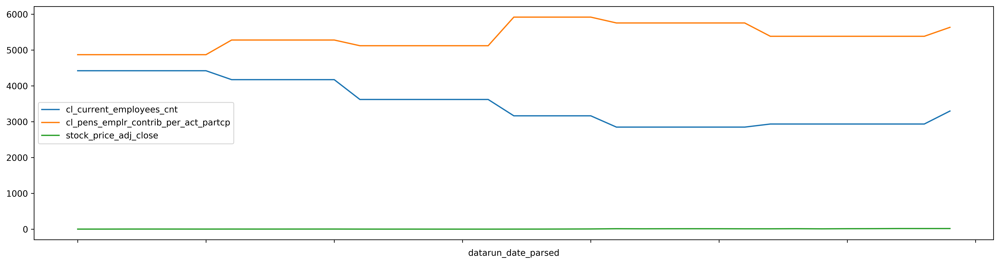

In [176]:
data_AMD_w_price.plot(x="datarun_date_parsed", y=["cl_current_employees_cnt", "cl_pens_emplr_contrib_per_act_partcp", "stock_price_adj_close"])
plt.show()

In [193]:
data_COTY_w_price=pd.read_csv(r"C:\Users\paro\Desktop\Axiomatic_public_company_historical_datasets\cl_companies_COTY_with_stock_price_adj_close.csv")

In [195]:
data_COTY_w_price.head()

,ticker,ein,datarun_date_parsed,datarun_date,company_ein,cl_company_name,datarun_date_parsed.1,date_of_stock_prices,stock_price_adj_close,cl_current_employees_cnt,...,cl_growth_pens_partcp_contrib_per_act_partcp_1yr,cl_growth_pens_partcp_contrib_per_act_partcp_2yr,cl_growth_pens_partcp_contrib_per_act_partcp_3yr,cl_growth_pens_partcp_contrib_per_partcp_1yr,cl_growth_pens_partcp_contrib_per_partcp_2yr,cl_growth_pens_partcp_contrib_per_partcp_3yr,russell_ticker,russell_name,russell_date_next_first,russell_exchange
0,COTY,133823358.0,3/1/2013,20130301.0,133823358.0,COTY INC.,3/1/2013,3/1/2013,14.096080,2047.0,...,105.0,NaN,NaN,103.0,NaN,NaN,NaN,NaN,NaN,NaN
1,COTY,133823358.0,4/1/2013,20130401.0,133823358.0,COTY INC.,4/1/2013,4/1/2013,14.096080,2047.0,...,105.0,NaN,NaN,103.0,NaN,NaN,NaN,NaN,NaN,NaN
2,COTY,133823358.0,5/1/2013,20130501.0,133823358.0,COTY INC.,5/1/2013,6/1/2013,14.939586,2047.0,...,105.0,NaN,NaN,103.0,NaN,NaN,NaN,NaN,NaN,NaN
3,COTY,133823358.0,9/1/2013,20130901.0,133823358.0,COTY INC.,9/1/2013,9/1/2013,14.096080,2047.0,...,105.0,NaN,NaN,103.0,NaN,NaN,NaN,NaN,NaN,NaN
4,COTY,133823358.0,10/1/2013,20131001.0,133823358.0,COTY INC.,10/1/2013,10/1/2013,13.374319,2047.0,...,105.0,NaN,NaN,103.0,NaN,NaN,NaN,NaN,NaN,NaN


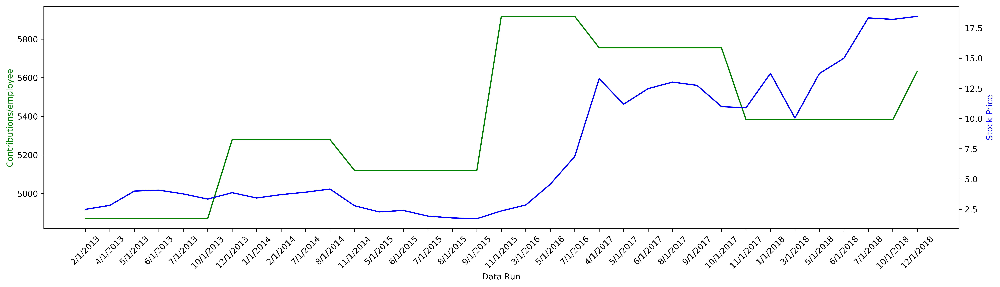

In [192]:
t = data_AMD_w_price['datarun_date_parsed']
y1 = data_AMD_w_price['cl_pens_emplr_contrib_per_act_partcp']
y2 = data_AMD_w_price['stock_price_adj_close']

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(t, y1, 'g-')
ax2.plot(t, y2, 'b-')

ax1.set_xlabel('Data Run')
ax1.set_ylabel('Contributions/employee', color='g')
ax2.set_ylabel('Stock Price', color='b')
ax1.set_xticklabels(t, rotation=45)
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams['figure.dpi'] = 600
plt.show()

Text(0.5,1,'Employment by IRS sector')

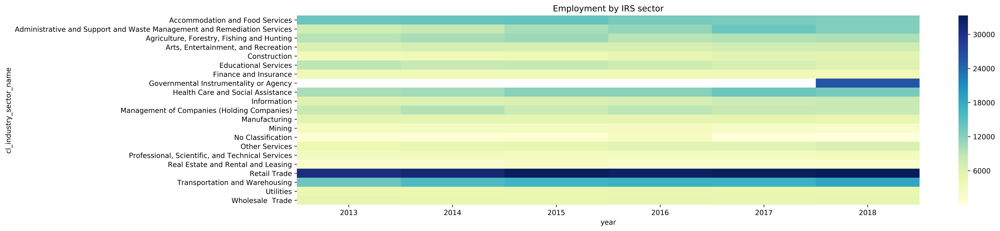

In [180]:
df = data[['cl_industry_sector_name','year','cl_current_employees_cnt']]

heatmap_data = pd.pivot_table(df,values='cl_current_employees_cnt', index=['cl_industry_sector_name'], columns='year')
sns.heatmap(heatmap_data, cmap="YlGnBu", yticklabels=heatmap_data.index)
plt.title("Employment by IRS sector")

Text(0.5,1,'Total contributions to pension plans by IRS sector')

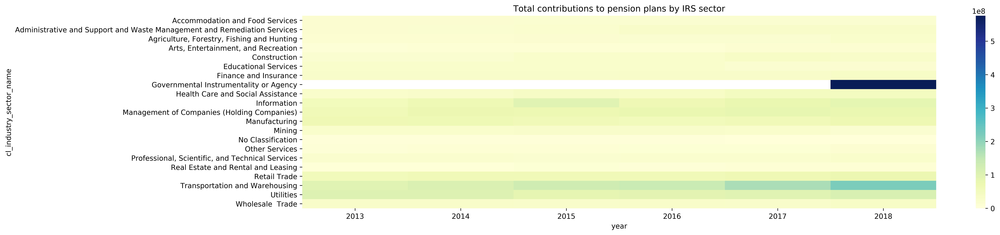

In [185]:
df2 = data[['cl_industry_sector_name','year','cl_pens_contrib_amt']]

heatmap_data = pd.pivot_table(df2,values='cl_pens_contrib_amt', index=['cl_industry_sector_name'], columns='year')
sns.heatmap(heatmap_data, cmap="YlGnBu", yticklabels=heatmap_data.index)
plt.title("Total contributions to pension plans by IRS sector")